In [1]:
# standard imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import pygmt
from pyproj import Proj, Geod
from osgeo import gdal
import pygmt
import rioxarray

import sys
sys.path.append('/Users/chanagan/Documents/GitHub/ImageryResources/Functions/')
import TiffTools as tt

# reload modules when changed
%reload_ext autoreload
%autoreload 2

P = Proj('epsg:32610')
G = Geod(ellps='WGS84')

In [2]:
P = Proj('epsg:32610')
G = Geod(ellps='WGS84')

## Seismicity with faults

In [5]:
seis = pd.read_csv('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/seismicity/ncalDDcatalogue.csv')

In [6]:
seis = seis[seis.Depth > -5]
seis

,Date,Time,Lat,Lon,Depth,Mag,Magt,Nst,Gap,Clo,RMS,SRC,Event,ID
2577,2007/03/08,04:40:05.55,36.23053,-120.79430,-4.996,1.22,Md,0,0,0,0.0,NCSN,71016771,NaN
2578,2018/04/22,06:33:15.93,36.19819,-120.77500,-4.996,1.41,Md,0,0,0,0.0,NCSN,73002761,NaN
2579,2000/09/12,18:00:32.07,36.27085,-120.84529,-4.992,1.29,Md,0,0,0,0.0,NCSN,21124732,NaN
2580,2008/07/10,14:36:28.40,36.22436,-120.78723,-4.991,1.30,Md,0,0,0,0.0,NCSN,40220478,NaN
2581,1988/12/15,03:20:07.37,36.29671,-120.87564,-4.991,1.30,Md,0,0,0,0.0,NCSN,128602,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3249,2005/01/17,18:23:59.00,36.20840,-120.74985,-0.043,0.91,Md,0,0,0,0.0,NCSN,21434013,NaN
3250,2022/07/30,11:14:00.56,36.16083,-120.76203,-0.039,0.97,Md,0,0,0,0.0,NCSN,73764356,NaN
3251,1984/04/15,03:06:56.48,36.10071,-120.67660,-0.018,1.19,Md,0,0,0,0.0,NCSN,1113867,NaN
3252,2022/06/19,06:17:32.86,36.17297,-120.76638,-0.005,1.00,Md,0,0,0,0.0,NCSN,73747416,NaN


ERROR 1: Unable to open datasource `/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp' with the following drivers.
  -> `PCIDSK'
  -> `PDS4'
  -> `VICAR'
  -> `JP2OpenJPEG'
  -> `MBTiles'
  -> `EEDA'
  -> `OGCAPI'
  -> `ESRI Shapefile'
  -> `MapInfo File'
  -> `UK .NTF'
  -> `LVBAG'
  -> `OGR_SDTS'
  -> `S57'
  -> `DGN'
  -> `OGR_VRT'
  -> `Memory'
  -> `CSV'
  -> `NAS'
  -> `GML'
  -> `GPX'
  -> `LIBKML'
  -> `KML'
  -> `GeoJSON'
  -> `GeoJSONSeq'
  -> `ESRIJSON'
  -> `TopoJSON'
  -> `Interlis 1'
  -> `Interlis 2'
  -> `OGR_GMT'
  -> `GPKG'
  -> `SQLite'
  -> `WAsP'
  -> `OpenFileGDB'
  -> `DXF'
  -> `CAD'
  -> `FlatGeobuf'
  -> `Geoconcept'
  -> `GeoRSS'
  -> `VFK'
  -> `PGDUMP'
  -> `OSM'
  -> `GPSBabel'
  -> `OGR_PDS'
  -> `WFS'
  -> `OAPIF'
  -> `EDIGEO'
  -> `SVG'
  -> `Idrisi'
  -> `ODS'
  -> `XLSX'
  -> `Elasticsearch'
  -> `Carto'
  -> `AmigoCloud'
  -> `SXF'
  -> `Selafin'
  -> `JML'
  -> `PLSCENES'
  -> `CSW'
  -> `VDV'
  -> `GMLA

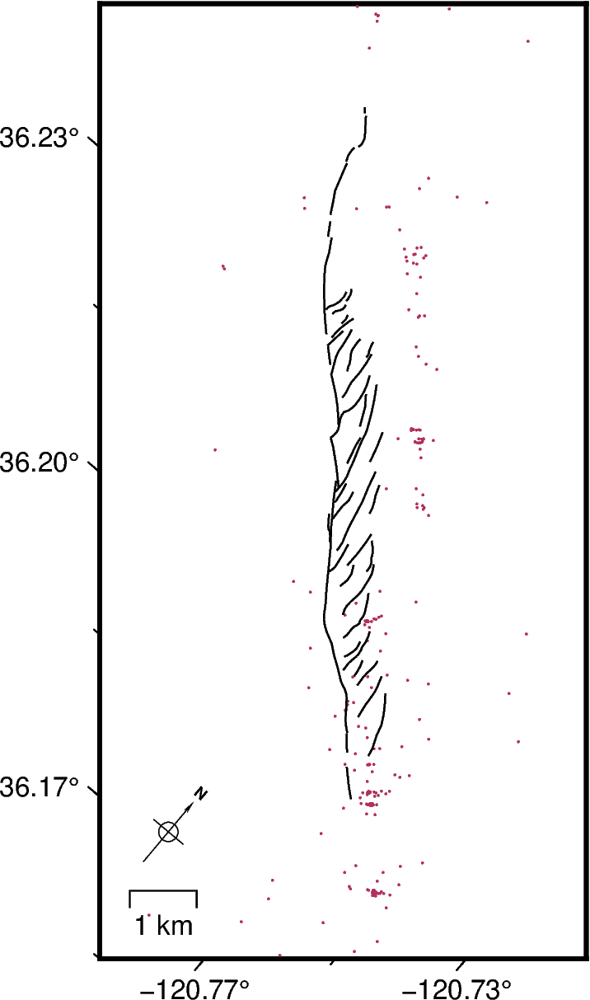

In [40]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

fig.basemap(
    projection="Oa-120.82/36.7/50/5c",
    # Set bottom left and top right coordinates of the figure with "+r"
    #36.16595,-120.77414 36.26946,-120.82648
    frame=["af"],
    region="-120.78/36.15/-120.82/36.29+r",
)


pygmt.makecpt(cmap='polar',series=[-1.5,1.5],background='o',reverse=True)
#fig.grdimage(grid=parSAR,cmap=True)

fig.basemap(map_scale='JBL+w1k+o-1c/-0.7c+l1km',rose='jBL+l,,,N+o0.45/1+w0.8c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')

fig.plot(x=seis.Lon,y=seis.Lat,style="c0.025c",fill="maroon")
fig.plot(data='/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Faults/DeLong2010/NewFaultsRevisionEPSG4326.shp', pen="0.5p,black")
fig.plot(data='/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp',pen="0.5p,grey")

fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/seismicitymap.pdf',dpi=300)

fig.show()

# Overview

In [ ]:
# Load all displacement rasters 
#image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/DisplacementRasters/ParallelDispWVCorr2009to2023.tif')
#parOrtho = image.rio.reproject("EPSG:4326")
#parOrtho.data[parOrtho.data == -9999] = np.nan
#parOrtho.data = (parOrtho.data-np.nanmedian(parOrtho.data))*100 # to cm
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/DisplacementRasters/MR_uavlosv_demeaned.tif')
parSAR = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/DisplacementRasters/MR_lidar_demeaned.tif')
parLidar = image.rio.reproject("EPSG:4326")


RasterioIOError: /Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/CSAF_Lidar/DisplacementRasters/MR_lidar_demeaned.tif: No such file or directory

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


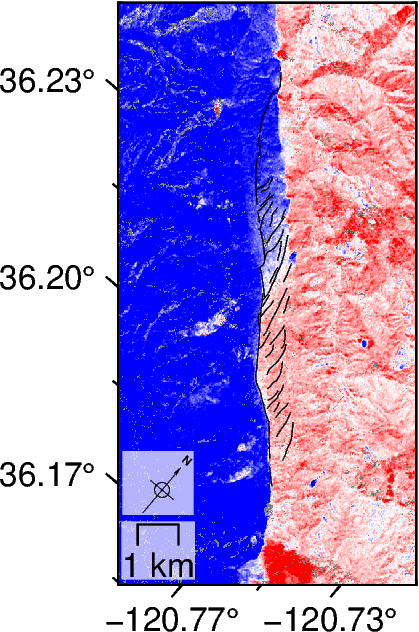

In [3]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

fig.basemap(
    projection="Oa-120.82/36.7/50/2.5c",
    # Set bottom left and top right coordinates of the figure with "+r"
    #36.16595,-120.77414 36.26946,-120.82648
    frame=["af"],
    region="-120.78/36.15/-120.82/36.29+r",
)


pygmt.makecpt(cmap='polar',series=[-1.5,1.5],background='o',reverse=True)
fig.grdimage(grid=parSAR,cmap=True)

fig.basemap(map_scale='JBL+w1k+o-0.5c/-0.5c+l1km',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')

fig.plot(data='/Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp', pen="0.17p,black")


fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/UAVSARmapLOS.pdf',dpi=300)

fig.show()


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


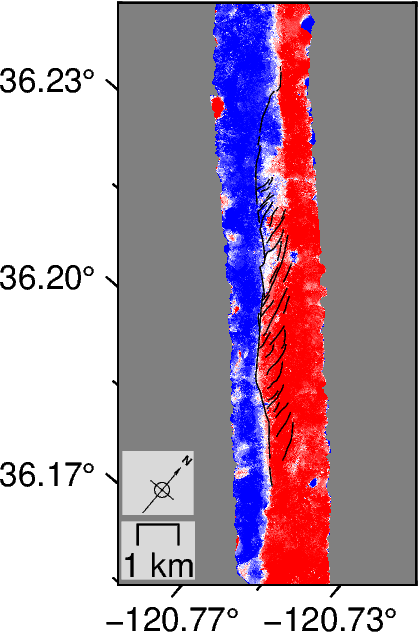

In [ ]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

fig.basemap(
    projection="Oa-120.82/36.7/50/2.5c",
    # Set bottom left and top right coordinates of the figure with "+r"
    frame=["af"],
    region="-120.78/36.15/-120.82/36.29+r",
)


pygmt.makecpt(cmap='polar',series=[-1.5,1.5],background='o',reverse=True)
fig.grdimage(grid=parLidar,cmap=True)

fig.basemap(map_scale='JBL+w1k+o-0.5c/-0.5c+l1km',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')

fig.plot(data='/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/GIS/DeLong2010/NewFaultsRevisionEPSG4326.shp', pen="0.17p,black")


fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/LIDARmapPar.pdf',dpi=300)

fig.show()


In [34]:
parLidar.data[~np.isnan(parLidar.data)]

array([-0.96423652, -0.96423652, -0.96423652, ...,  0.16070609,
        0.16070609,  0.16070609])

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


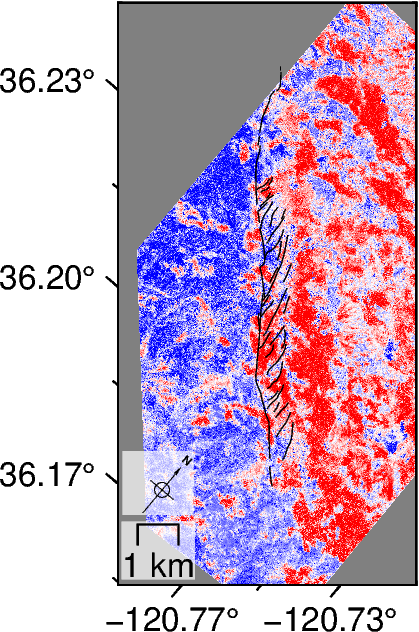

In [ ]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

fig.basemap(
    projection="Oa-120.82/36.7/50/2.5c",
    # Set bottom left and top right coordinates of the figure with "+r"
    frame=["af"],
    region="-120.78/36.15/-120.82/36.29+r",
)


pygmt.makecpt(cmap='polar',series=[-1.5,1.5],background='o',reverse=True)
#fig.grdimage(grid=parOrtho,cmap=True)

fig.basemap(map_scale='JBL+w1k+o-0.5c/-0.5c+l1km',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')

fig.plot(data='/Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp', pen="0.17p,black")


fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/WVOrthoMapPar.pdf',dpi=300)

fig.show()


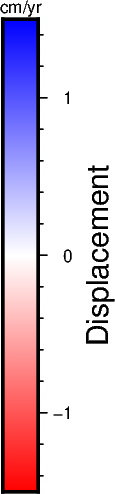

In [9]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap='polar',series=[-1.5,1.5],background='o',reverse=True)
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lDisplacement", "y+lcm/yr"])
fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/DispColorbar.pdf',dpi=300)
fig.show()

In [8]:
def projectParPerp(ew,ns,az):
    # Rotation from en (xy) to fault parallel and perp, must convert azimuth
    theta = (90-az)*np.pi/180
    par = ns*np.sin(theta)+ew*np.cos(theta)
    perp = -1*ns*np.cos(theta)+ew*np.sin(theta)
    return par, perp


In [ ]:
## Alignment Array Data
'''
meeAA = pd.read_csv('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/CSAF_Lidar/OtherDisplacements/MeeRanchAA/MeeRanchAA_BBrooks_GNSS.txt',sep=',',comment='#')
mpAA = pd.read_csv('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/CSAF_Lidar/OtherDisplacements/MonarchPeakAA/MonarchPeakAA_20180809_20240917.txt',sep='\t')

res = list(map(projectParPerp,meeAA['Velocity (E)'].values,meeAA['Velocity (N)'].values,[-35]*len(meeAA)))
par, perp = np.array(res)[:,0], np.array(res)[:,1]
meeAA['par'] = par
meeAA['perp'] = perp
res = list(map(projectParPerp,mpAA['Velocity (E)'].values,mpAA['Velocity (N)'].values,[-35]*len(mpAA)))
par, perp = np.array(res)[:,0], np.array(res)[:,1]
mpAA['par'] = par
mpAA['perp'] = perp

print('Straightline either side of fault')
print('Mee AA (mm)',-1*np.round(meeAA[:13].par.mean()-meeAA[13:].par.mean(),1), '+-', \
      np.round(np.sqrt(np.std(meeAA[:13].par)**2+np.std(meeAA[13:].par)**2),1))
print('Mp AA (mm)',np.round(mpAA[:5].par.mean()-mpAA[5:].par.mean(),1), '+-', \
      np.round(np.sqrt(np.std(mpAA[:5].par)**2+np.std(mpAA[5:].par)**2),1))
print('Mp AA (end-to-end, mm)',np.round(mpAA.par.iloc[0]-mpAA.par.iloc[-1],1))
print('Line fit either side of fault')
e, n = P(mpAA.Longitude,mpAA.Latitude)[0],P(mpAA.Longitude,mpAA.Latitude)[1]
loc = np.array(list(map(projectParPerp,e-e[0],n-n[0],[-36]*len(mpAA))))[:,1]
reg = LinearRegression(fit_intercept=True).fit(loc[:5].reshape(-1,1),mpAA.par.values[:5].reshape(-1,1))
left = reg.predict(np.mean(loc[4:6]).reshape(-1,1))
left_err = sum(np.sqrt((reg.predict(loc[:5].reshape(-1,1))-mpAA.par.values[:5].reshape(-1,1))**2))/5
reg = LinearRegression(fit_intercept=True).fit(loc[5:].reshape(-1,1),mpAA.par.values[5:].reshape(-1,1))
right = reg.predict(np.mean(loc[4:6]).reshape(-1,1))
right_err = sum(np.sqrt((reg.predict(loc[5:].reshape(-1,1))-mpAA.par.values[5:].reshape(-1,1))**2))/3
print('Mp AA (mm)',np.round((right-left)[0][0],1),'+-',np.round(np.sqrt(left_err**2+right_err**2)[0],1))

# Switch back to 45 degrees
res = list(map(projectParPerp,meeAA['Velocity (E)'].values,meeAA['Velocity (N)'].values,[-45]*len(meeAA)))
par, perp = np.array(res)[:,0], np.array(res)[:,1]
meeAA['par'] = par
meeAA['perp'] = perp
res = list(map(projectParPerp,mpAA['Velocity (E)'].values,mpAA['Velocity (N)'].values,[-45]*len(mpAA)))
par, perp = np.array(res)[:,0], np.array(res)[:,1]
mpAA['par'] = par
mpAA['perp'] = perp
'''
# Rates assuming originally straight lines
meeAA = pd.read_csv('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/OtherDisplacements/MeeRanchAA/MEE_9-18-2024_postprocessed_WGS84UTM10.txt',sep='\t',comment='#')[:-1]
mpAA = pd.read_csv('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/OtherDisplacements/MonarchPeakAA/MPAA_9-17-2024_uncorrected_WGS84UTM10.txt',sep='\t')[1:-1]

# Switch back to 45 degrees
loc = np.array(list(map(projectParPerp,mpAA['Easting'].values,mpAA['Northing'].values,[-46]*len(mpAA))))
parloc = loc[:,0] - loc[:,0][0]
perploc = loc[:,1] - loc[:,1][1]
reg = LinearRegression(fit_intercept=True).fit(perploc[:4].reshape(-1,1),parloc[:4].reshape(-1,1),)
orig_line = reg.predict(perploc.reshape(-1,1)).flatten()
mpAA['perp_loc'] = perploc
mpAA['parvel'] = (orig_line-parloc)/(2024-1968)*100
loc = np.array(list(map(projectParPerp,meeAA['Easting'].values,meeAA['Northing'].values,[-46]*len(meeAA))))
parloc = loc[:,0] - loc[:,0][0]
perploc = loc[:,1] - loc[:,1][1]
reg = LinearRegression(fit_intercept=True).fit(perploc[:4].reshape(-1,1),parloc[:4].reshape(-1,1),)
orig_line = reg.predict(perploc.reshape(-1,1)).flatten()
meeAA['perp_loc'] = perploc
meeAA['parvel'] = (orig_line-parloc)/(2024-1968)*100

In [7]:
from sklearn.linear_model import LinearRegression

In [8]:
def projectParPerp(ew,ns,az):
    # Rotation from en (xy) to fault parallel and perp, must convert azimuth
    theta = (90-az)*np.pi/180
    par = ns*np.sin(theta)+ew*np.cos(theta)
    perp = -1*ns*np.cos(theta)+ew*np.sin(theta)
    return par, perp

loc = np.array(list(map(projectParPerp,mpAA['Easting'].values,mpAA['Northing'].values,[-36]*len(mpAA))))
parloc = loc[:,0] - loc[:,0][0]
perploc = loc[:,1] - loc[:,1][1]
reg = LinearRegression(fit_intercept=True).fit(perploc[:4].reshape(-1,1),parloc[:4].reshape(-1,1),)
orig_line = reg.predict(perploc.reshape(-1,1)).flatten()
mpAA['perp_loc'] = perploc
mpAA['parvel'] = (orig_line-parloc)/(2024-1968)*100
loc = np.array(list(map(projectParPerp,meeAA['Easting'].values,meeAA['Northing'].values,[-36]*len(meeAA))))
parloc = loc[:,0] - loc[:,0][0]
perploc = loc[:,1] - loc[:,1][1]
reg = LinearRegression(fit_intercept=True).fit(perploc[:4].reshape(-1,1),parloc[:4].reshape(-1,1),)
orig_line = reg.predict(perploc.reshape(-1,1)).flatten()
meeAA['perp_loc'] = perploc
meeAA['parvel'] = (orig_line-parloc)/(2024-1968)*100

In [72]:
# pea1 minus pea2
navg = (12.95+33.01)/2
eavg = (-10.11+-27.62)/2
p1 =  pd.DataFrame({'lon':[-120.7586],'lat':[36.18691],'dx':[-10.11-eavg],'dy':[12.95-navg]})
p2 =  pd.DataFrame({'lon':[-120.76685],'lat':[36.18053],'dx':[-27.62-eavg],'dy':[33.01-navg]})

dfmee = pd.DataFrame({'lon':meeAA.Longitude,'lat':meeAA.Latitude,'dx':meeAA['Velocity (E)']-eavg,'dy':meeAA['Velocity (N)']-navg})
dfmp = pd.DataFrame({'lon':mpAA.Longitude,'lat':mpAA.Latitude,'dx':mpAA['Velocity (E)']-mpAA['Velocity (E)'].mean(),'dy':mpAA['Velocity (N)']-mpAA['Velocity (N)'].mean()})

KeyError: 'Velocity (E)'

In [16]:
subregion = [-120.818512, 36.219191, -120.785624, 36.232056]
subregion = [-120.86102, 36.16672,-120.72018,36.26133] 
smallreg1 = [-120.761,36.1783,-120.756,36.1825]
smallreg2 = [-120.7985,36.215,-120.797,36.216]

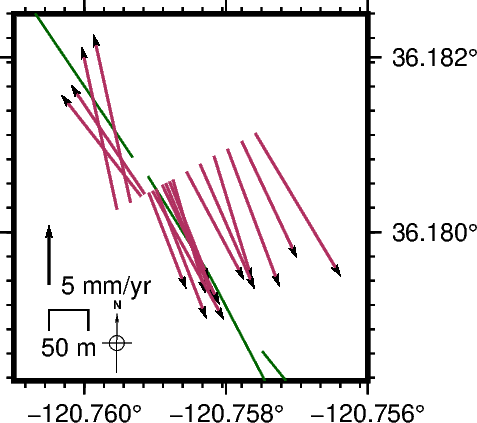

In [ ]:
# SUbregion
# Introductory figure base

fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xxx")
pygmt.config(FONT_LABEL="6p")
pygmt.config(FONT_ANNOT_PRIMARY="6p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
region = [subregion[0],subregion[2],subregion[1],subregion[3]]
region = [smallreg1[0],smallreg1[2],smallreg1[1],smallreg1[3]]
#region = [smallreg2[0],smallreg2[2],smallreg2[1],smallreg2[3]]
fig.basemap(region=region, projection="M3c", frame=["ESnw", "a0.002f"])

# gridimage
pygmt.makecpt(cmap='polar',series=[-0.25,0.25],background='o',reverse=True)
#fig.grdimage(grid=dP,cmap=True)

# Fault Trace
#pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
#pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Faults/DeLong2010/NewFaultsRevisionEPSG4326.shp',pen="0.5p,darkgreen")
fig.plot('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp',pen="0.5p,darkgreen")
#rectangle = [[e_inset[0], e_inset[2], e_inset[1], e_inset[3]]]
#fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")


# vectors, Mee1 and Mee2
fig.velo(dfmee
         ,spec="e0.1/1+f6",
    #uncertaintyfill="lightblue1",
    pen="0.6p,maroon",
    line=True,
    vector="0.1c+p1p+e+gmaroon",)

# Scale
fig.velo(pd.DataFrame({'Lon':[-120.7605],'Lat':[36.1794],'dx':[0],'dy':[5],
                       'sigE':[0],'sigN':[0],'l':['5 mm/yr']})
         ,spec="e0.1/1+f6",
    #uncertaintyfill="lightblue1",
    pen="0.6p,black",
    line=True,
    vector="0.1c+p1p+e+gblack",)

fig.basemap(map_scale='JBR+w50e+o-2.7c/-.6c+lm',rose='jBL+l,,,N+o2/0.07+w0.5c')#'jBR+l,,,N+o1.8/1.7+w0.5c'
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/meeAAmap.pdf',dpi=300)
fig.show()

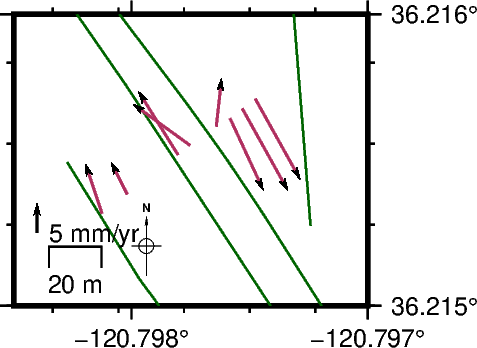

In [ ]:
# MONARCH PEAK MAP
# Introductory figure base

fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xxx")
pygmt.config(FONT_LABEL="6p")
pygmt.config(FONT_ANNOT_PRIMARY="6p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
region = [subregion[0],subregion[2],subregion[1],subregion[3]]
region = [smallreg2[0],smallreg2[2],smallreg2[1],smallreg2[3]]
fig.basemap(region=region, projection="M3c", frame=["ESnw", "a0.001f"])

# gridimage
pygmt.makecpt(cmap='polar',series=[-0.25,0.25],background='o',reverse=True)
#fig.grdimage(grid=dP,cmap=True)

# Fault Trace
#pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
#pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Faults/DeLong2010/NewFaultsRevisionEPSG4326.shp',pen="0.5p,darkgreen")
fig.plot('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp',pen="0.5p,darkgreen")
#rectangle = [[e_inset[0], e_inset[2], e_inset[1], e_inset[3]]]
#fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")


# vectors, MP
fig.velo(dfmp
         ,spec="e0.05/1+f18",
    #uncertaintyfill="lightblue1",
    pen="0.6p,maroon",
    line=True,
    vector="0.1c+p1p+e+gmaroon",)

# Scale
fig.velo(pd.DataFrame({'Lon':[-120.7984],'Lat':[36.21525],'dx':[0],'dy':[5],
                       'sigE':[0],'sigN':[0],'l':['5 mm/yr']})
         ,spec="e0.05/1+f6",
    #uncertaintyfill="lightblue1",
    pen="0.6p,black",
    line=True,
    vector="0.1c+p1p+e+gblack",)

fig.basemap(map_scale='JBR+w20e+o-2.7c/-.5c+lm',rose='jBL+l,,,N+o1/1.6+w0.5c')
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/mpAAmap.pdf',dpi=300)
fig.show()

In [82]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

fig.basemap(
    projection="Oa-120.82/36.7/50/2.5c",
    # Set bottom left and top right coordinates of the figure with "+r"
    frame=["af"],
    region="-120.78/36.15/-120.82/36.29+r",
)


#pygmt.makecpt(cmap='polar',series=[-1.5,1.5],background='o',reverse=True)
#fig.grdimage(grid=parOrtho,cmap=True)

fig.basemap(map_scale='JBL+w1k+o-0.5c/-0.5c+l1km',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')

rectangle = [[-120.77,36.175,-120.75,36.19]]
fig.plot(data=rectangle, style="r+s", pen="1p,maroon")

fig.plot(data='/Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp', pen="0.17p,black")
#fig.plot(x=meeAA['Longitude'],y=meeAA['Latitude'],pen='1p,green')

fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/AAplacement.pdf',dpi=300)

fig.show()

plot [ERROR]: File /Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp was not found
plot [ERROR]: Cannot find file /Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp


GMTCLibError: Module 'plot' failed with status code 72:
plot [ERROR]: File /Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp was not found
plot [ERROR]: Cannot find file /Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp

## Velocity vecotr maps

In [20]:
# standard imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import pygmt
from pyproj import Proj, Geod
from osgeo import gdal
import pygmt
import rioxarray

import sys
sys.path.append('/Users/chanagan/Documents/GitHub/ImageryResources/Functions/')
import TiffTools as tt

# reload modules when changed
%reload_ext autoreload
%autoreload 2

P = Proj('epsg:32610')
G = Geod(ellps='WGS84')

In [21]:
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/DisplacementRasters/MR_lidar_ew_demeaned.tif')
image = image.coarsen(x=10, y=10, boundary="pad").median()
EW = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/DisplacementRasters/MR_lidar_ns_demeaned.tif')
image = image.coarsen(x=10, y=10, boundary="pad").median()
NS = image.rio.reproject("EPSG:4326")


In [22]:
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/DisplacementRasters/MR_lidar_demeaned.tif')
parLidar = image.rio.reproject("EPSG:4326")

In [24]:
dfvelo = pd.DataFrame({'lon':np.meshgrid(EW.x,EW.y)[0].flatten(), 
                     'lat':np.meshgrid(EW.x,EW.y)[1].flatten(), 
                     'dx':EW.data.flatten(),
                     'dy':NS.data.flatten()})
dfvelo = dfvelo[~dfvelo.isin([-9999]).any(axis=1)]
dfvelo.dx = dfvelo.dx
dfvelo.dy = dfvelo.dy
dfvelo['x'] = P(dfvelo.lon,dfvelo.lat)[0]
dfvelo['y'] = P(dfvelo.lon,dfvelo.lat)[1]


In [25]:
dfvelo.to_csv('/Users/chanagan/Downloads/velo.csv')

In [26]:
fltptdf1 = pd.read_csv('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/GIS/FinalFaultGeomFiles/MRMRTraceSW.csv')
fltptdf1['lon'], fltptdf1['lat'] = P(fltptdf1.X,fltptdf1.Y,inverse=True)
fltptdf2 = pd.read_csv('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/GIS/FinalFaultGeomFiles/MRMRTraceNE.csv')
fltptdf2['lon'], fltptdf2['lat'] = P(fltptdf2.X,fltptdf2.Y,inverse=True)

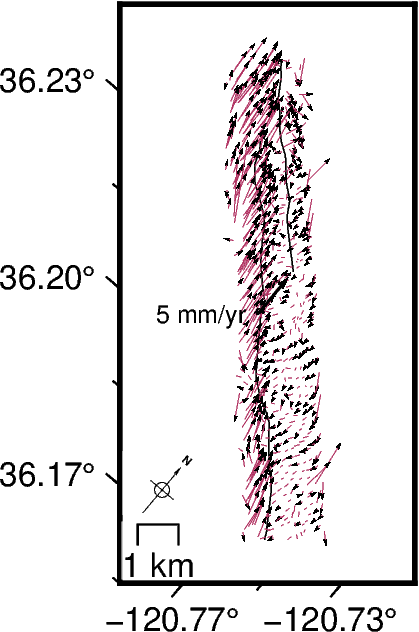

In [27]:
# MONARCH PEAK MAP
# Introductory figure base

fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

fig.basemap(
    projection="Oa-120.82/36.7/50/2.5c",
    # Set bottom left and top right coordinates of the figure with "+r"
    frame=["af"],
    region="-120.78/36.15/-120.82/36.29+r",
)


#pygmt.makecpt(cmap='polar',series=[-1.5,1.5],background='o',reverse=True)
#fig.grdimage(grid=parLidar,cmap=True)

#fig.plot(data='/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/GIS/DeLong2010/NewFaultsRevisionEPSG4326.shp', pen="0.17p,black")

fig.plot(x=fltptdf1.lon.values,y=fltptdf1.lat.values)
fig.plot(x=fltptdf2.lon.values,y=fltptdf2.lat.values)

fig.velo(dfvelo[::1400],
         spec="e0.07/0.05+f6",
    #uncertaintyfill="lightblue1",
    pen="0.1p,maroon",
    line=True,
    vector="0.05c+p0.6p+e+gmaroon",)

# Scale
fig.velo(pd.DataFrame({'Lon':[-120.7984],'Lat':[36.21525],'dx':[0],'dy':[5],
                       'sigE':[0],'sigN':[0],'l':['5 mm/yr']})
         ,spec="e0.08/0.08+f6",
    #uncertaintyfill="lightblue1",
    pen="0.6p,black",
    line=True,
    vector="0.1c+p1p+e+gblack",)

fig.basemap(map_scale='JBL+w1k+o-0.5c/-0.5c+l1km',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/mpAAmap.pdf',dpi=300)
fig.show()

In [ ]:
# MONARCH PEAK MAP
# Introductory figure base

fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

fig.basemap(
    projection="Oa-120.82/36.7/50/2.5c",
    # Set bottom left and top right coordinates of the figure with "+r"
    frame=["af"],
    region="-120.78/36.15/-120.82/36.29+r",
)


#pygmt.makecpt(cmap='polar',series=[-1.5,1.5],background='o',reverse=True)
#fig.grdimage(grid=parLidar,cmap=True)

#fig.plot(data='/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/GIS/DeLong2010/NewFaultsRevisionEPSG4326.shp', pen="0.17p,black")

fig.plot(x=fltptdf1.lon.values,y=fltptdf1.lat.values)
fig.plot(x=fltptdf2.lon.values,y=fltptdf2.lat.values)

fig.velo(dfvelo[::1400],
         spec="e0.07/0.05+f6",
    #uncertaintyfill="lightblue1",
    pen="0.1p,maroon",
    line=True,
    vector="0.05c+p0.6p+e+gmaroon",)

# Scale
fig.velo(pd.DataFrame({'Lon':[-120.7984],'Lat':[36.21525],'dx':[0],'dy':[5],
                       'sigE':[0],'sigN':[0],'l':['5 mm/yr']})
         ,spec="e0.08/0.08+f6",
    #uncertaintyfill="lightblue1",
    pen="0.6p,black",
    line=True,
    vector="0.1c+p1p+e+gblack",)

fig.basemap(map_scale='JBL+w1k+o-0.5c/-0.5c+l1km',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/mpAAmap.pdf',dpi=300)
fig.show()

## AA Profiles

In [213]:
# standard imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import pygmt
from pyproj import Proj, Geod
from osgeo import gdal
import pygmt
import rioxarray

import sys
sys.path.append('/Users/chanagan/Documents/GitHub/ImageryResources/Functions/')
import TiffTools as tt

# reload modules when changed
%reload_ext autoreload
%autoreload 2

P = Proj('epsg:32610')
G = Geod(ellps='WGS84')

In [13]:
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/DisplacementRasters/MR_uavlosv_demeaned.tif')
parSAR = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/DisplacementRasters/MR_lidar_demeaned.tif')
parLidar = image.rio.reproject("EPSG:4326")

In [14]:
# Define crossprofile 
crossLength = 5
crossSample = 0.5


In [15]:
from sklearn.linear_model import LinearRegression
def projectParPerp(ew,ns,az):
    # Rotation from en (xy) to fault parallel and perp, must convert azimuth
    theta = (90-az)*np.pi/180
    par = ns*np.sin(theta)+ew*np.cos(theta)
    perp = -1*ns*np.cos(theta)+ew*np.sin(theta)
    return par, perp

# Rates assuming originally straight lines
meeAA = pd.read_csv('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/OtherDisplacements/MeeRanchAA/MEE_9-18-2024_postprocessed_WGS84UTM10.txt',sep='\t',comment='#')[:-1]
mpAA = pd.read_csv('/Volumes/ProjectsGarlockCSAF/CSAF_Lidar/OtherDisplacements/MonarchPeakAA/MPAA_9-17-2024_uncorrected_WGS84UTM10.txt',sep='\t')[1:-1]

# Switch back to 45 degrees
loc = np.array(list(map(projectParPerp,mpAA['Easting'].values,mpAA['Northing'].values,[-45]*len(mpAA))))
parloc = loc[:,0] - loc[:,0][0]
perploc = loc[:,1] - loc[:,1][1]
reg = LinearRegression(fit_intercept=True).fit(perploc[:4].reshape(-1,1),parloc[:4].reshape(-1,1),)
orig_line = reg.predict(perploc.reshape(-1,1)).flatten()
mpAA['perp_loc'] = perploc
mpAA['parvel'] = -1*((orig_line-parloc)-(orig_line-parloc)[0])/(2024-1968)*100
loc = np.array(list(map(projectParPerp,meeAA['Easting'].values,meeAA['Northing'].values,[-45]*len(meeAA))))
parloc = loc[:,0] - loc[:,0][0]
perploc = loc[:,1] - loc[:,1][1]
reg = LinearRegression(fit_intercept=True).fit(perploc[-6:].reshape(-1,1),parloc[-6:].reshape(-1,1),)
orig_line = reg.predict(perploc.reshape(-1,1)).flatten()
meeAA['perp_loc'] = perploc
meeAA['parvel'] = -1*((orig_line-parloc)-(orig_line-parloc)[0])/(2024-1968)*100

In [212]:
meeAA[0:3].parvel.mean()-meeAA[-13:].parvel.mean()

np.float64(2.1963713646430074)

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdtrack.py:309: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


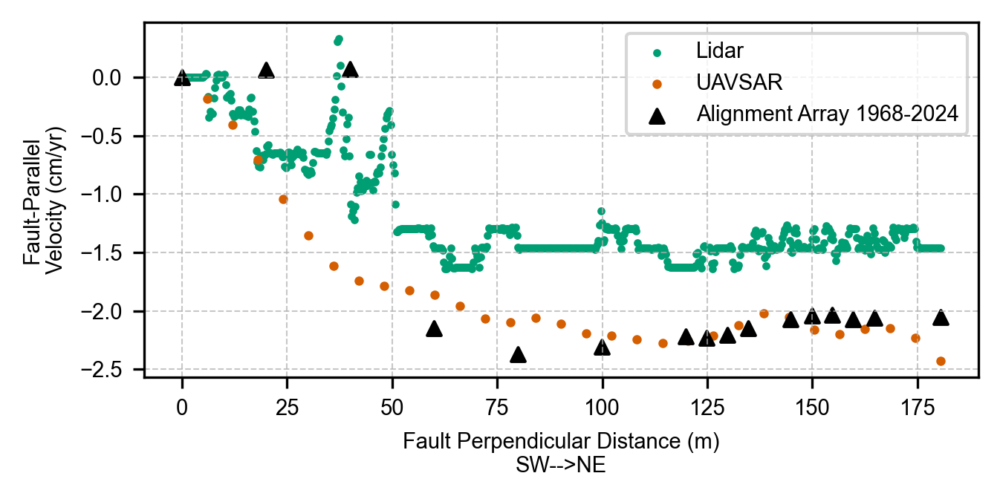

In [203]:
# Plot mee comparison
minpt = meeAA[meeAA.Longitude == meeAA.Longitude.min()][['Longitude','Latitude']].values[0]
maxpt = meeAA[meeAA.Longitude == meeAA.Longitude.max()][['Longitude','Latitude']].values[0]

trackLidar = pygmt.grdtrack(grid=parLidar,profile=f'{minpt[0]}/{minpt[1]}/{maxpt[0]}/{maxpt[1]}',
               binary='id')#,crossprofile='5e/0.5e/0.5e',stack='m+a+d')#,resample='0.5e')
trackSAR = pygmt.grdtrack(grid=parSAR,profile=f'{minpt[0]}/{minpt[1]}/{maxpt[0]}/{maxpt[1]}',
               binary='id')

distAA = np.sort(G.inv([meeAA.Longitude.iloc[-1]]*len(meeAA),[meeAA.Latitude.iloc[-1]]*len(meeAA),meeAA.Longitude,meeAA.Latitude)[-1])
distSAR = np.sort(G.inv([trackSAR[0].iloc[-1]]*len(trackSAR),[trackSAR[1].iloc[-1]]*len(trackSAR),trackSAR[0],trackSAR[1])[-1])
distLidar = np.sort(G.inv([trackLidar[0].iloc[-1]]*len(trackLidar),[trackLidar[1].iloc[-1]]*len(trackLidar),trackLidar[0],trackLidar[1])[-1])

plt.figure(figsize=(4.5,2.25), dpi=300)

# Ensure Arial font is used and set font size to 7pt
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7
})

plt.scatter(distLidar,trackLidar[2]-trackLidar[2].iloc[0],color='#009E73',s=2.5,label='Lidar')
plt.scatter(distSAR,trackSAR[2]-trackSAR[2].iloc[0],color='#D55E00',s=4,label='UAVSAR')
plt.scatter(distAA,meeAA.parvel-meeAA.parvel.iloc[0],color='black',s=20,marker='^',label='Alignment Array 1968-2024')

# Customize labels, grid, and legend
plt.xlabel('Fault Perpendicular Distance (m)\nSW-->NE')
plt.ylabel('Fault-Parallel\nVelocity (cm/yr)')
plt.legend(loc='upper right', fontsize=7)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Show plot
plt.tight_layout()
plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/MeeAA.svg')
plt.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdtrack.py:309: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


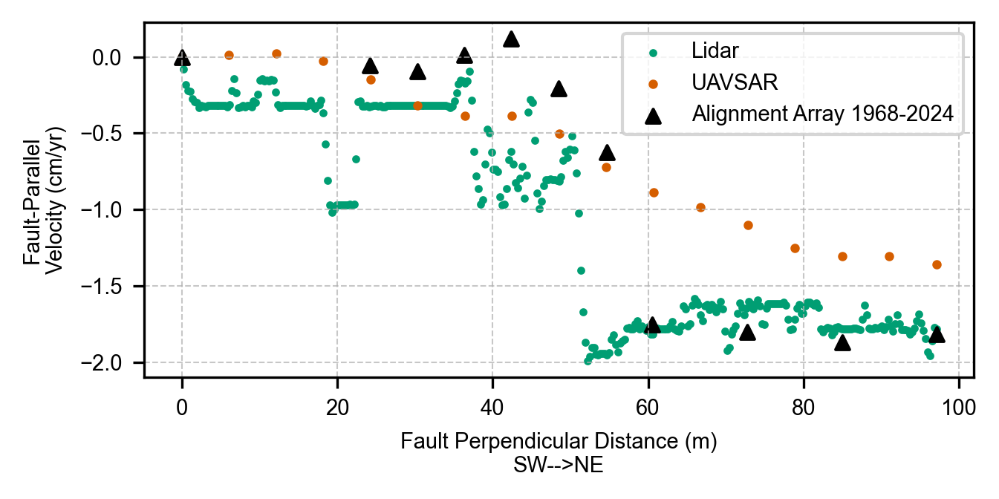

In [206]:
# Plot mp comparison

# Plot mee comparison
minpt = mpAA[mpAA.Longitude == mpAA.Longitude.min()][['Longitude','Latitude']].values[0]
maxpt = mpAA[mpAA.Longitude == mpAA.Longitude.max()][['Longitude','Latitude']].values[0]

trackLidar = pygmt.grdtrack(grid=parLidar,profile=f'{minpt[0]}/{minpt[1]}/{maxpt[0]}/{maxpt[1]}',
               binary='id')#,crossprofile='5e/0.5e/0.5e',stack='m+a+d')#,resample='0.5e')
trackSAR = pygmt.grdtrack(grid=parSAR,profile=f'{minpt[0]}/{minpt[1]}/{maxpt[0]}/{maxpt[1]}',
               binary='id')

distAA = np.sort(G.inv([mpAA.Longitude.iloc[-1]]*len(mpAA),[mpAA.Latitude.iloc[-1]]*len(mpAA),mpAA.Longitude,mpAA.Latitude)[-1])
distSAR = np.sort(G.inv([trackSAR[0].iloc[-1]]*len(trackSAR),[trackSAR[1].iloc[-1]]*len(trackSAR),trackSAR[0],trackSAR[1])[-1])
distLidar = np.sort(G.inv([trackLidar[0].iloc[-1]]*len(trackLidar),[trackLidar[1].iloc[-1]]*len(trackLidar),trackLidar[0],trackLidar[1])[-1])

plt.figure(figsize=(4.5,2.25), dpi=300)

# Ensure Arial font is used and set font size to 7pt
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7
})

plt.scatter(distLidar,trackLidar[2]-trackLidar[2].iloc[0],color='#009E73',s=2.5,label='Lidar')
plt.scatter(distSAR,trackSAR[2]-trackSAR[2].iloc[0],color='#D55E00',s=4,label='UAVSAR')
plt.scatter(distAA,mpAA.parvel-mpAA.parvel.iloc[0],color='black',s=20,marker='^',label='Alignment Array 1968-2024')

# Customize labels, grid, and legend
plt.xlabel('Fault Perpendicular Distance (m)\nSW-->NE')
plt.ylabel('Fault-Parallel\nVelocity (cm/yr)')
plt.legend(loc='upper right', fontsize=7)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Show plot
plt.tight_layout()
plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/MpAA.svg')
plt.show()

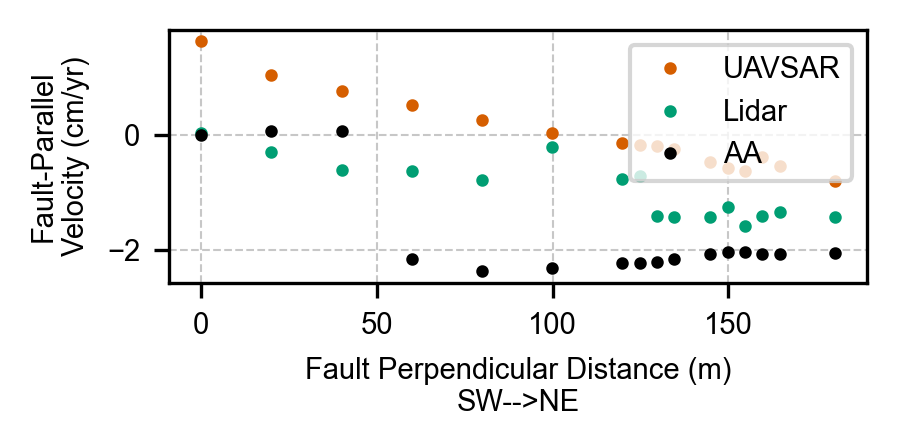

In [ ]:
# Plot mee comparison
dist = np.sort(G.inv([meeAA.Longitude.iloc[-1]]*len(meeAA),[meeAA.Latitude.iloc[-1]]*len(meeAA),meeAA.Longitude,meeAA.Latitude)[-1])

# Ensure Arial font is used and set font size to 7pt
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7
})

# Define colorblind-friendly colors
colors = {
    'trackSAR': '#D55E00',      # A colorblind-friendly alternative to orange
    'trackLidar': '#009E73',    # A colorblind-friendly alternative to teal
    'meeAA': 'black',
    #'trackOrtho': '#0072B2'     # A colorblind-friendly blue for trackOrtho
}

# Create the figure and axis
fig, ax = plt.subplots(figsize=(3, 1.5), dpi=300)  # Higher DPI for publication quality

# Plot trackSAR with error bars
ax.errorbar(
    dist, 
    trackSAR.pmean , 
    #yerr=trackSAR['std'], 
    fmt='o', 
    color=colors['trackSAR'], 
    label='UAVSAR', 
    capsize=1,
    linewidth=1,
    markersize=2
)

# Plot trackLidar with error bars
ax.errorbar(
    dist, 
    (trackLidar.pmean ), 
    fmt='o', 
    color=colors['trackLidar'], 
    label='Lidar', 
    capsize=1,
    linewidth=1,
    markersize=2
)

# Plot meeAA data with Sigma (E) error bars
ax.errorbar(
    dist, 
    (meeAA.parvel ) , 
    #yerr=meeAA['Sigma (E)'] / 10,  # Use Sigma (E) as error
    fmt='o', 
    color=colors['meeAA'], 
    label='AA', 
    capsize=1,
    linewidth=1,
    markersize=2
)



# Customize labels, grid, and legend
ax.set_xlabel('Fault Perpendicular Distance (m)\nSW-->NE')
ax.set_ylabel('Fault-Parallel\nVelocity (cm/yr)')
ax.legend(loc='upper right', fontsize=7)
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Show plot
plt.tight_layout()
plt.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Desktop/Manuscripts/Garlock/Figures/MeeAA.svg')
plt.show()



In [40]:
start = mpAA.query(f'Longitude == {min(mpAA.Longitude)}')[['Longitude','Latitude']].values
stop = mpAA.query(f'Longitude == {max(mpAA.Longitude)}')[['Longitude','Latitude']].values
pts = mpAA[['Longitude','Latitude']].values

for im in [parSAR]:
    # Create crossprofiles along a line
    # 2 endpoints provided in pts
    # crossprofiles are length/sample spacing along profile/space between each profile
    # e is the unit notation for meter
    # stack a means the mean value (a is average) appended to each profile (+a), +da appends standard deviation too
    # Output is lon, lat, dist, azimuth,value of grid, mean of stack, stdev of stack
    trackSAR = pd.DataFrame(columns=['id','lon','lat','pmean','std'])
    for i in range(0,len(pts)):
        tmp = pygmt.grdtrack(im,points=np.array([pts[i]]),binary='id')
                                #crossprofile=f'{crossLength}e/{crossSample}e')
        tmp.columns = ['lon','lat','val']
        tmp['id'] = np.ones(len(tmp))*i
        # replace lon of individual profile with center of stack
        trackSAR = pd.concat([trackSAR,
                           pd.DataFrame([[i,tmp.lon.iloc[0],tmp.lat.iloc[0],tmp.val]],
                                        columns=["id", "lon", "lat", "pmean"])],
                           ignore_index=True)
for im in [parLidar]:
    # Create crossprofiles along a line
    # 2 endpoints provided in pts
    # crossprofiles are length/sample spacing along profile/space between each profile
    # e is the unit notation for meter
    # stack a means the mean value (a is average) appended to each profile (+a), +da appends standard deviation too
    # Output is lon, lat, dist, azimuth,value of grid, mean of stack, stdev of stack
    trackLidar = pd.DataFrame(columns=['id','lon','lat','pmean','std'])
    for i in range(0,len(pts)):
        tmp = pygmt.grdtrack(im,points=np.array([pts[i]]),binary='id')
                                #crossprofile=f'{crossLength}e/{crossSample}e')
        tmp.columns = ['lon','lat','val']
        tmp['id'] = np.ones(len(tmp))*i
        # replace lon of individual profile with center of stack
        trackLidar = pd.concat([trackLidar,
                           pd.DataFrame([[i,tmp.lon.iloc[0],tmp.lat.iloc[0],tmp.val]],
                                        columns=["id", "lon", "lat", "pmean"])],
                           ignore_index=True)
    print('Hi')

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdtrack.py:309: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_35144/914414016.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  trackSAR = pd.concat([trackSAR,
/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdtrack.py:309: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may resul

Hi


In [39]:
tmp

,lon,lat,val,id
0,-120.798126,36.215316,0.730516,0.0


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)
/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/matplotlib/cbook.py:1398: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return np.asarray(x, float)


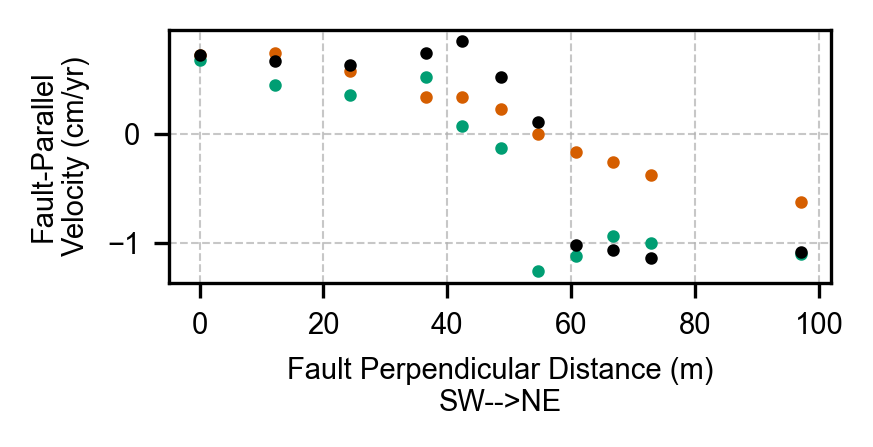

In [ ]:
# Plot mee comparison
dist = G.inv([mpAA.Longitude.iloc[0]]*len(mpAA),[mpAA.Latitude.iloc[0]]*len(mpAA),mpAA.Longitude,mpAA.Latitude)[-1]

# Ensure Arial font is used and set font size to 7pt
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7
})

# Define colorblind-friendly colors
colors = {
    'trackSAR': '#D55E00',      # A colorblind-friendly alternative to orange
    'trackLidar': '#009E73',    # A colorblind-friendly alternative to teal
    'mpAA': 'black',
    #'trackOrtho': '#0072B2'     # A colorblind-friendly blue for trackOrtho
}

# Create the figure and axis
fig, ax = plt.subplots(figsize=(3, 1.5), dpi=300)  # Higher DPI for publication quality

# Plot trackOrtho with error bars
#ax.errorbar(
#    dist, 
#    trackOrtho.pmean - trackOrtho.pmean.mean(), 
#    yerr=trackOrtho['std'], 
#    fmt='o', 
#    color=colors['trackOrtho'], 
#    label='WorldView', 
#    capsize=1,
#    linewidth=1,
#    markersize=2
#)

# Plot trackSAR with error bars
ax.errorbar(
    dist, 
    trackSAR.pmean , 
    fmt='o', 
    color=colors['trackSAR'], 
    label='UAVSAR', 
    capsize=1,
    linewidth=1,
    markersize=2
)

# Plot trackLidar with error bars
ax.errorbar(
    dist, 
    trackLidar.pmean , 
    fmt='o', 
    color=colors['trackLidar'], 
    label='Lidar', 
    capsize=1,
    linewidth=1,
    markersize=2
)

# Plot meeAA data with Sigma (E) error bars
ax.errorbar(
    dist, 
    (mpAA.parvel - mpAA.parvel.mean()) ,  
    fmt='o', 
    color=colors['mpAA'], 
    label='AA', 
    capsize=1,
    linewidth=1,
    markersize=2
)



# Customize labels, grid, and legend
ax.set_xlabel('Fault Perpendicular Distance (m)\nSW-->NE')
ax.set_ylabel('Fault-Parallel\nVelocity (cm/yr)')
#ax.legend(loc='lower right', fontsize=7)
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Show plot
plt.tight_layout()
plt.show()

In [69]:
## Maps Comparison for Mee and Monarch


In [11]:
ew = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/CSAF_Lidar/MEC_old/EWmicmac.tif')
ew = ew.rio.reproject("EPSG:4326")
ns = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/CSAF_Lidar/MEC_old/NSmicmac.tif')
ns = ns.rio.reproject("EPSG:4326")

start = mpAA.query(f'Longitude == {min(mpAA.Longitude)}')[['Longitude','Latitude']].values
stop = mpAA.query(f'Longitude == {max(mpAA.Longitude)}')[['Longitude','Latitude']].values
pts = mpAA[['Longitude','Latitude']].values

trackDisp = pd.DataFrame({'lon':np.zeros(len(pts)),'lat':np.zeros(len(pts)),'dE':np.zeros(len(pts)),'dEstd':np.zeros(len(pts)),'dN':np.zeros(len(pts)),'dNstd':np.zeros(len(pts))})

for j,im in enumerate([ew,ns]):
    # Create crossprofiles along a line
    # 2 endpoints provided in pts
    # crossprofiles are length/sample spacing along profile/space between each profile
    # e is the unit notation for meter
    # stack a means the mean value (a is average) appended to each profile (+a), +da appends standard deviation too
    # Output is lon, lat, dist, azimuth,value of grid, mean of stack, stdev of stack
    trackMAP = pd.DataFrame(columns=["id", "lon", "lat", "pmean", "std"])
    for i in range(0,len(pts)):
        tmp = pygmt.grdtrack(im,points=np.array([pts[i]]),binary='id',
                                crossprofile=f'{crossLength}e/{crossSample}e')
        tmp.columns = ['lon','lat','linedist','az','val']
        tmp['id'] = np.ones(len(tmp))*i
        # replace lon of individual profile with center of stack
        tmp['lon'] = np.ones(len(tmp))*tmp['lon'][tmp.linedist == 0].median()
        tmp['lat'] = np.ones(len(tmp))*tmp['lat'][tmp.linedist == 0].median()
        trackMAP = pd.concat([trackMAP,
                           pd.DataFrame([[i,tmp.lon.iloc[0],tmp.lat.iloc[0],tmp.val.mean(),np.std(tmp.val)]],
                                        columns=["id", "lon", "lat", "pmean", "std"])],
                           ignore_index=True)

    if j == 0:
        trackDisp['lon'] = trackMAP['lon']
        trackDisp['lat'] = trackMAP['lat']
        trackDisp['dE'] = trackMAP["pmean"]
        trackDisp['dEstd'] = trackMAP["std"]
    if j == 1:
        trackDisp['dN'] = trackMAP["pmean"]
        trackDisp['dNstd'] = trackMAP["std"]


NameError: name 'crossLength' is not defined

In [14]:
trackDisp = pd.DataFrame({'lon':np.zeros(len(pts)),'lat':np.zeros(len(pts)),'dE':np.zeros(len(pts)),'dEstd':np.zeros(len(pts)),'dN':np.zeros(len(pts)),'dNstd':np.zeros(len(pts))})

for j,im in enumerate([ew,ns]):
    # Create crossprofiles along a line
    # 2 endpoints provided in pts
    # crossprofiles are length/sample spacing along profile/space between each profile
    # e is the unit notation for meter
    # stack a means the mean value (a is average) appended to each profile (+a), +da appends standard deviation too
    # Output is lon, lat, dist, azimuth,value of grid, mean of stack, stdev of stack
    trackMAP = pd.DataFrame(columns=["id", "lon", "lat", "pmean", "std"])
    for i in range(0,len(pts)):
        tmp = pygmt.grdtrack(im,points=np.array([pts[i]]),binary='id',
                                crossprofile=f'{crossLength}e/{crossSample}e')
        tmp.columns = ['lon','lat','linedist','az','val']
        tmp['id'] = np.ones(len(tmp))*i
        # replace lon of individual profile with center of stack
        tmp['lon'] = np.ones(len(tmp))*tmp['lon'][tmp.linedist == 0].median()
        tmp['lat'] = np.ones(len(tmp))*tmp['lat'][tmp.linedist == 0].median()
        trackMAP = pd.concat([trackMAP,
                           pd.DataFrame([[i,tmp.lon.iloc[0],tmp.lat.iloc[0],tmp.val.mean(),np.std(tmp.val)]],
                                        columns=["id", "lon", "lat", "pmean", "std"])],
                           ignore_index=True)

    if j == 0:
        trackDisp['lon'] = trackMAP['lon']
        trackDisp['lat'] = trackMAP['lat']
        trackDisp['dE'] = trackMAP["pmean"]
        trackDisp['dEstd'] = trackMAP["std"]
    if j == 1:
        trackDisp['dN'] = trackMAP["pmean"]
        trackDisp['dNstd'] = trackMAP["std"]

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdtrack.py:309: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_52557/1879884128.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  trackMAP = pd.concat([trackMAP,
/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdtrack.py:309: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may resu

In [21]:
trackDisp['dEs'] = (trackDisp.dE - trackDisp.dE.mean())*100
trackDisp['dNs'] = (trackDisp.dN - trackDisp.dN.mean())*100
trackDisp

,lon,lat,dE,dEstd,dN,dNstd,dEs,dNs
0,-120.798126,36.215316,0.745253,2.886202e-02,0.380976,0.090400,-0.896865,-4.415968
1,-120.798019,36.215383,0.745126,9.861498e-03,0.437551,0.012045,-0.909539,1.241459
2,-120.797803,36.215518,0.759892,2.012208e-02,0.538145,0.019377,0.567055,11.300901
3,-120.797752,36.215550,0.750000,1.296461e-16,0.510547,0.017692,-0.422148,8.541062
4,-120.797641,36.215615,0.749924,2.392021e-04,0.377004,0.039903,-0.429712,-4.813256
5,-120.797584,36.215644,0.767471,2.420129e-02,0.387921,0.031659,1.324989,-3.721526
6,-120.797531,36.215676,0.750000,1.296461e-16,0.373892,0.023334,-0.422148,-5.124418
7,-120.797477,36.215710,0.766105,2.268472e-02,0.395054,0.009236,1.188368,-3.008255


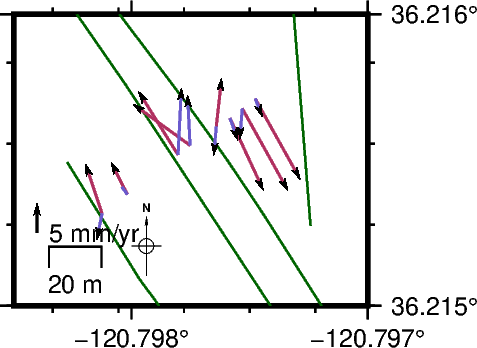

In [24]:
# MONARCH PEAK MAP
# Introductory figure base

fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xxx")
pygmt.config(FONT_LABEL="6p")
pygmt.config(FONT_ANNOT_PRIMARY="6p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
region = [subregion[0],subregion[2],subregion[1],subregion[3]]
region = [smallreg2[0],smallreg2[2],smallreg2[1],smallreg2[3]]
fig.basemap(region=region, projection="M3c", frame=["ESnw", "a0.001f"])

# gridimage
pygmt.makecpt(cmap='polar',series=[-0.25,0.25],background='o',reverse=True)
#fig.grdimage(grid=dP,cmap=True)

# Fault Trace
#pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
#pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Faults/DeLong2010/NewFaultsRevisionEPSG4326.shp',pen="0.5p,darkgreen")
fig.plot('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp',pen="0.5p,darkgreen")
#rectangle = [[e_inset[0], e_inset[2], e_inset[1], e_inset[3]]]
#fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")


# vectors, MP
fig.velo(dfmp
         ,spec="e0.05/1+f18",
    #uncertaintyfill="lightblue1",
    pen="0.6p,maroon",
    line=True,
    vector="0.1c+p1p+e+gmaroon",)
fig.velo(trackDisp[['lon', 'lat', 'dEs', 'dNs']]
         ,spec="e0.05/1+f18",
    #uncertaintyfill="lightblue1",
    pen="0.6p,slateblue",
    line=True,
    vector="0.1c+p1p+e+gslateblue",)

# Scale
fig.velo(pd.DataFrame({'Lon':[-120.7984],'Lat':[36.21525],'dx':[0],'dy':[5],
                       'sigE':[0],'sigN':[0],'l':['5 mm/yr']})
         ,spec="e0.05/1+f6",
    #uncertaintyfill="lightblue1",
    pen="0.6p,black",
    line=True,
    vector="0.1c+p1p+e+gblack",)

fig.basemap(map_scale='JBR+w20e+o-2.7c/-.5c+lm',rose='jBL+l,,,N+o1/1.6+w0.5c')
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/mpAAmap.pdf',dpi=300)
fig.show()

(3.4450000000000003, 7.4375, 3.9583333333333335)

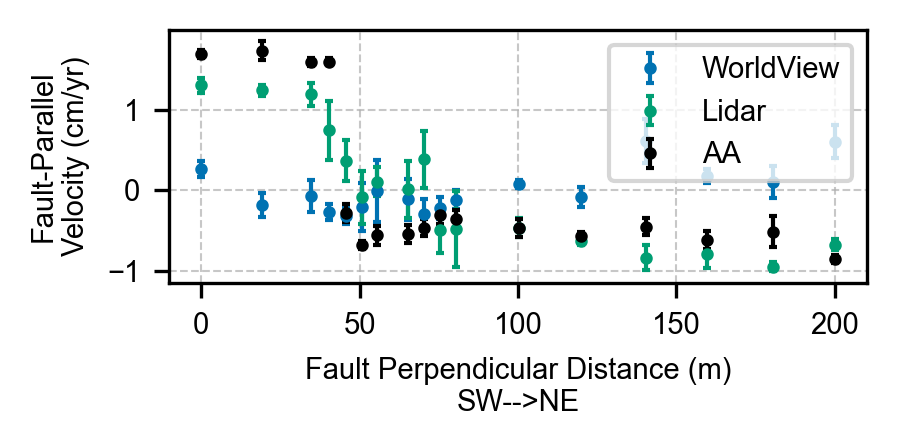

In [197]:
import matplotlib.pyplot as plt

# Ensure Arial font is used and set font size to 7pt
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7
})

# Define colorblind-friendly colors
colors = {
    'trackLidar': '#009E73',    # A colorblind-friendly alternative to teal
    'meeAA': 'black',
    'trackOrtho': '#0072B2'     # A colorblind-friendly blue for trackOrtho
}

# Create the figure and axis
fig, ax = plt.subplots(figsize=(3, 1.5), dpi=300)  # Higher DPI for publication quality

# Plot trackOrtho with error bars
ax.errorbar(
    dist, 
    trackOrtho.pmean - trackOrtho.pmean.mean(), 
    yerr=trackOrtho['std'], 
    fmt='o', 
    color=colors['trackOrtho'], 
    label='WorldView', 
    capsize=1,
    linewidth=1,
    markersize=2
)


# Plot trackLidar with error bars
ax.errorbar(
    dist, 
    trackLidar.pmean - trackLidar.pmean.mean(), 
    yerr=trackLidar['std'], 
    fmt='o', 
    color=colors['trackLidar'], 
    label='Lidar', 
    capsize=1,
    linewidth=1,
    markersize=2
)

# Plot meeAA data with Sigma (E) error bars
ax.errorbar(
    dist, 
    (meeAA.par - meeAA.par.mean()) / 10, 
    yerr=meeAA['Sigma (E)'] / 10,  # Use Sigma (E) as error
    fmt='o', 
    color=colors['meeAA'], 
    label='AA', 
    capsize=1,
    linewidth=1,
    markersize=2
)



# Customize labels, grid, and legend
ax.set_xlabel('Fault Perpendicular Distance (m)\nSW-->NE')
ax.set_ylabel('Fault-Parallel\nVelocity (cm/yr)')
ax.legend(loc='upper right', fontsize=7)
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Show plot
plt.tight_layout()
plt.show()


# Image Snippets

In [122]:
# Load all displacement rasters 
image = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/MRMRWV2009to2023/micmac/orthos/mm23JUL28220223.tif')
ortho = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/big_data/LidarCSAFtiffs/2018_dem_MRMR_mosaic.tif')
lidar = image.rio.reproject("EPSG:4326")



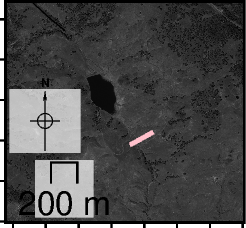

In [176]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=[-120.77,-120.75,36.175,36.19], projection="M2c", frame=['f'])


pygmt.makecpt(cmap="gray", series=[100,1500, 1])
fig.grdimage(grid=ortho,cmap=True)

fig.basemap(map_scale='JBL+w200e+o-0.6c/-0.5c+l10m',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')

fig.plot(data='/Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp', pen="0.17p,black")
fig.plot(x=meeAA['Longitude'],y=meeAA['Latitude'],pen='1p,pink')

fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/OrthoSnip.pdf',dpi=300)

fig.show()

In [188]:
dgrid = pygmt.grdgradient(grid=lidar, radiance=[270, 30])

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdgradient.py:170: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


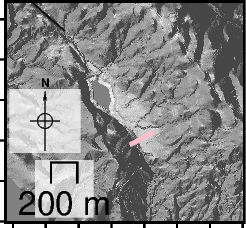

In [189]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=[-120.77,-120.75,36.175,36.19], projection="M2c", frame=['f'])


pygmt.makecpt(cmap="gray", series=[-1.5,0.5, 0.0001])
fig.grdimage(grid=dgrid,cmap=True)

fig.basemap(map_scale='JBL+w200e+o-0.6c/-0.5c+l10m',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')

fig.plot(data='/Volumes/Extreme Pro/Projects/MRMRallDeformationComparison/GIS/NewFaultsRevisionEPSG4326.shp', pen="0.17p,black")
fig.plot(x=meeAA['Longitude'],y=meeAA['Latitude'],pen='1p,pink')

fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/MRMR/Figures/LidarSnip.pdf',dpi=300)

fig.show()

In [12]:
meeAA['meanSAR'] = np.empty(len(meeAA))
for i in range(0,len(meeAA)):
    meeAA['meanSAR'].iloc[i] = np.mean(pygmt.grdcut(parSAR, region=f'{meeAA['minx'].iloc[i]}/{meeAA['maxx'].iloc[i]}/{meeAA['miny'].iloc[i]}/{meeAA['maxy'].iloc[i]}').data)

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdcut.py:105: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  with lib.virtualfile_in(check_kind="raster", data=grid) as vingrd:
grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from -120.757634466 to -120.757648216
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from -120.757545534 to -120.75753713
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from 36.1810939517 to 36.1810328192
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an

: 

## Overview map



In [14]:
grid = pygmt.datasets.load_earth_relief(
    resolution='02m',
    region=[-127.00,-67.790,16.605,49.10],
    use_srtm=True)

dgrid = pygmt.grdgradient(grid=grid, radiance=[315, 60])


grdblend [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
grdblend [NOTICE]: SRTM15 Earth Relief v2.6 at 02x02 arc minutes reduced by Gaussian Cartesian filtering (10.5 km fullwidth) [Tozer et al., 2019].
grdblend [NOTICE]:   -> Download 60x60 degree grid tile (earth_relief_02m_g): S30W180


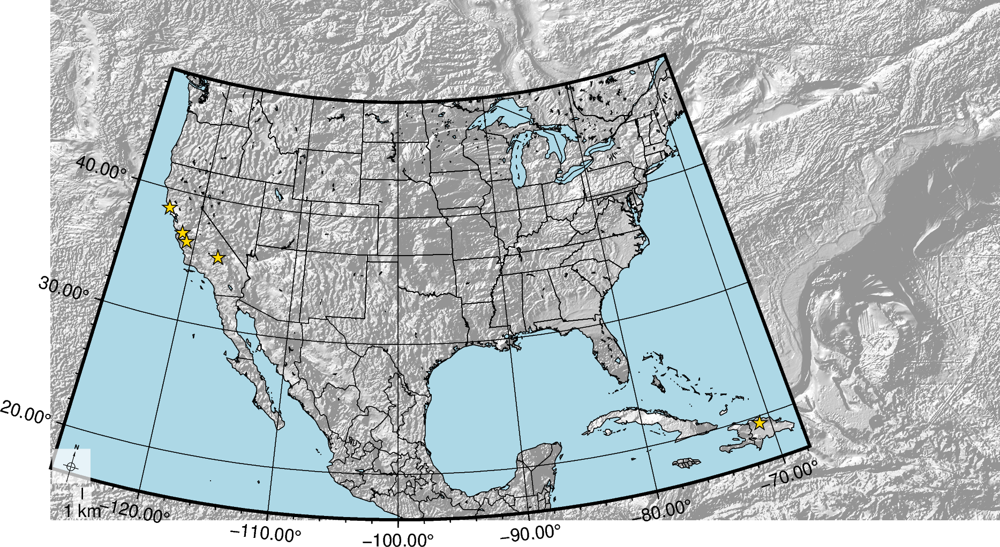

In [23]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")
             #MAP_GRID_PEN='0.5p,lightgray')

# Hillshade
pygmt.makecpt(cmap="gray", series=[-2.7, 0.3, 0.01],transparency=60)
fig.grdimage(grid=dgrid, cmap=True)
fig.coast(
    projection="L-100/35/33/45/12c",
    frame="afg",
    borders='a',
    #land="gray",
    water="lightblue",
    shorelines=True,
    region=[-127.00,-67.790,16.605,49.10],
)

#fig.plot(data='/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp', pen="0.2p,darkgrey")

fig.plot(y=36.78864,x=-121.36361,style='a0.25c',pen='black',fill='gold')
fig.plot(y=38.51358,x=-123.21125,style='a0.25c',pen='black',fill='gold')
fig.plot(y=35.4662,x=-117.4930,style='a0.25c',pen='black',fill='gold')
fig.plot(y=36.1919,x=-120.7917,style='a0.25c',pen='black',fill='gold')
fig.plot(y=19.467,x=-70.884,style='a0.25c',pen='black',fill='gold')

fig.basemap(map_scale='JBL+w1k+o-0.5c/-0.5c+l1km',rose='jBL+l,,,N+o0.2/0.6+w0.5c',box="+c0.05/0.02+gwhite@30,grey@30,solid")#+w1k+o-2c/-1c+lkm')#,box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')


fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Applications/STVproposal2024/Figures/OverviewMap.pdf',dpi=300)

fig.show()

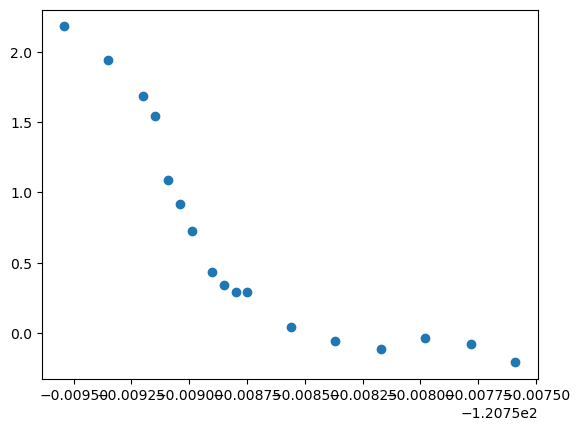

: 

In [ ]:
plt.scatter(meeAA.Longitude, means)


In [38]:
meePos

,name,YYYYMMDD,idk,decyr,doy,5,6,7,8,9,10,11,12,13,14,Lat,Lon,Ht
0,me02,20230610,P,2023.4399,161,-2.636177e+06,0.0036,-4.429679e+06,0.0054,3.744868e+06,0.0044,0.8397,-0.8184,-0.8718,MeeRanchAlignmentArray_ITRF2014_20230610.staco...,36.181131,-120.757591,736.176400
1,me04,20230608,P,2023.4344,159,-2.636358e+06,0.0018,-4.429641e+06,0.0029,3.744791e+06,0.0024,0.8111,-0.7422,-0.8404,MeeRanchAlignmentArray_ITRF2014_20230608.staco...,36.180258,-120.759535,739.425426
2,me05,20230607,P,2023.4317,158,-2.636338e+06,0.0030,-4.429641e+06,0.0049,3.744796e+06,0.0043,0.8083,-0.7780,-0.8522,MeeRanchAlignmentArray_ITRF2014_20230607.staco...,36.180344,-120.759347,733.978793
3,me06,20230607,P,2023.4317,158,-2.636323e+06,0.0034,-4.429643e+06,0.0059,3.744801e+06,0.0047,0.8276,-0.8038,-0.8737,MeeRanchAlignmentArray_ITRF2014_20230607.staco...,36.180413,-120.759196,732.071753
4,me07,20230607,P,2023.4317,158,-2.636319e+06,0.0036,-4.429644e+06,0.0057,3.744803e+06,0.0045,0.8319,-0.7745,-0.8835,MeeRanchAlignmentArray_ITRF2014_20230607.staco...,36.180436,-120.759146,731.764947
5,me08,20230607,P,2023.4317,158,-2.636314e+06,0.0032,-4.429645e+06,0.0058,3.744804e+06,0.0045,0.8308,-0.8069,-0.8923,MeeRanchAlignmentArray_ITRF2014_20230607.staco...,36.180449,-120.759091,731.504635
6,me09,20230607,P,2023.4317,158,-2.636309e+06,0.0032,-4.429646e+06,0.0053,3.744805e+06,0.0043,0.8214,-0.8000,-0.8763,MeeRanchAlignmentArray_ITRF2014_20230607.staco...,36.180469,-120.759043,731.155219
7,me10,20230609,P,2023.4371,160,-2.636305e+06,0.0030,-4.429647e+06,0.0047,3.744807e+06,0.0041,0.8209,-0.7857,-0.8624,MeeRanchAlignmentArray_ITRF2014_20230609.staco...,36.180492,-120.758994,730.823980
8,me12,20230607,P,2023.4317,158,-2.636295e+06,0.0036,-4.429649e+06,0.0057,3.744811e+06,0.0045,0.8354,-0.8081,-0.8901,MeeRanchAlignmentArray_ITRF2014_20230607.staco...,36.180536,-120.758897,730.457070
9,me13,20230607,P,2023.4317,158,-2.636291e+06,0.0022,-4.429650e+06,0.0035,3.744813e+06,0.0027,0.8441,-0.7410,-0.8504,MeeRanchAlignmentArray_ITRF2014_20230607.staco...,36.180558,-120.758849,730.407362


In [ ]:
meeAA.columns = ['YYYYMMDD','decyr',]

,0,1,2,3,4,5,6,7,8,9,10
0,20031026,2003.8174,-138.8,139.8,-38.1,rrr,3.3,3.7,12.0,0.0390,MeeRanchAlignmentArray_ITRF2014_20031026.staco...
1,20181017,2018.7936,14.1,-25.3,-5.4,rrr,3.2,3.9,12.0,0.0515,MeeRanchAlignmentArray_ITRF2014_20181017.staco...
2,20220323,2022.2242,62.3,-64.6,18.5,rrr,5.1,6.4,21.8,0.0888,MeeRanchAlignmentArray_ITRF2014_20220323.staco...
3,20220324,2022.2270,62.4,-61.8,25.2,rrr,4.1,4.9,17.1,-0.0387,MeeRanchAlignmentArray_ITRF2014_20220324.staco...
4,20230609,2023.4371,75.8,-88.3,55.9,ppp,5.5,6.5,21.9,-0.0347,MeeRanchAlignmentArray_ITRF2014_20230609.staco...
5,20230610,2023.4399,73.3,-95.6,29.3,ppp,5.2,6.8,22.4,-0.0165,MeeRanchAlignmentArray_ITRF2014_20230610.staco...


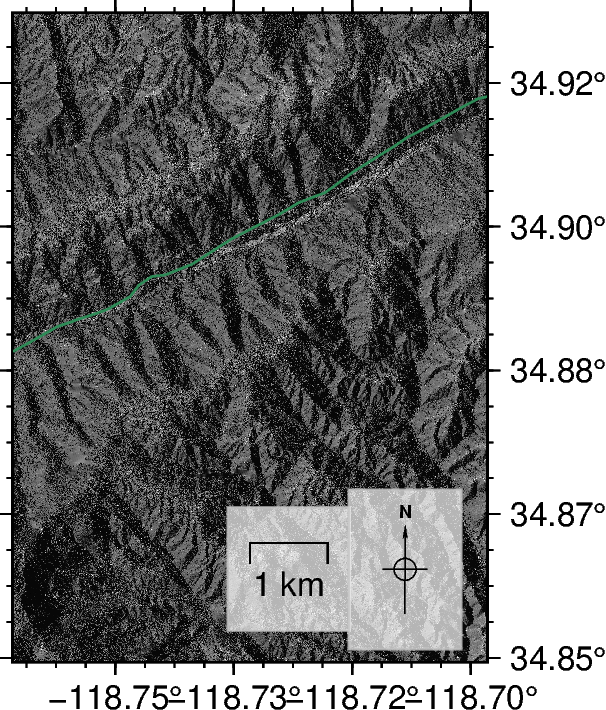

In [16]:

# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=small_region, projection="M4c", frame=["ESnw", "af"])

# DEM
pygmt.makecpt(cmap="gray", series=[-1, 0.75, 0.01],transparency=60)
fig.grdimage(grid=dgrid,cmap=True)
# Fault
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockWDEMSmallRegion.pdf',dpi=300)
fig.show()

# East and West Orthophotos

In [5]:
# Load ortho
image = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/East/micmac/20APR28214017-P1BS_R3C1-merged-f32.tif')
im1_lonlat = image.rio.reproject("EPSG:4326")
# Load ortho
image = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/West/micmac/19JUL26214314-P1BS-merged-f32.tif')
im2_lonlat = image.rio.reproject("EPSG:4326")


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


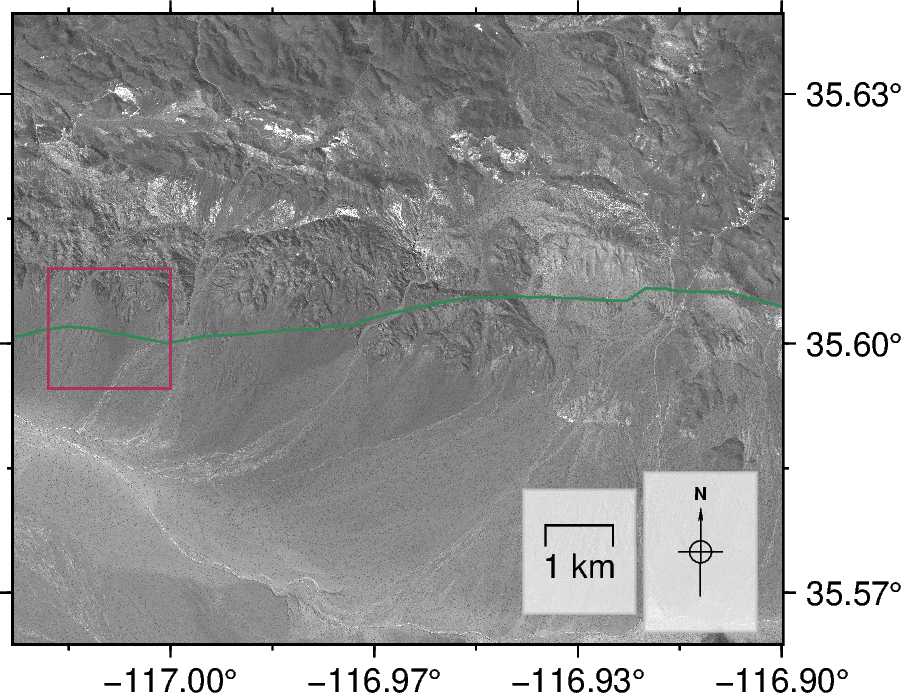

In [22]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=e_inset_region, projection="M6.5c", frame=["ESnw", "af"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im1_lonlat,cmap=True)
# Fault Trace
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

rectangle = [[e_inset[0], e_inset[2], e_inset[1], e_inset[3]]]
fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")


fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockEInset.pdf',dpi=300)
fig.show()


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


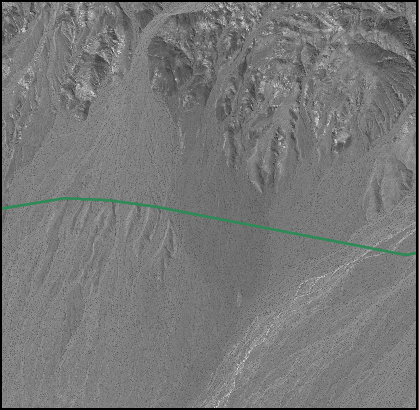

In [64]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=e_inset, projection="M3.5c", frame=["esnw"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im1_lonlat,cmap=True)
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockEInsetZoom.pdf',dpi=300)
fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


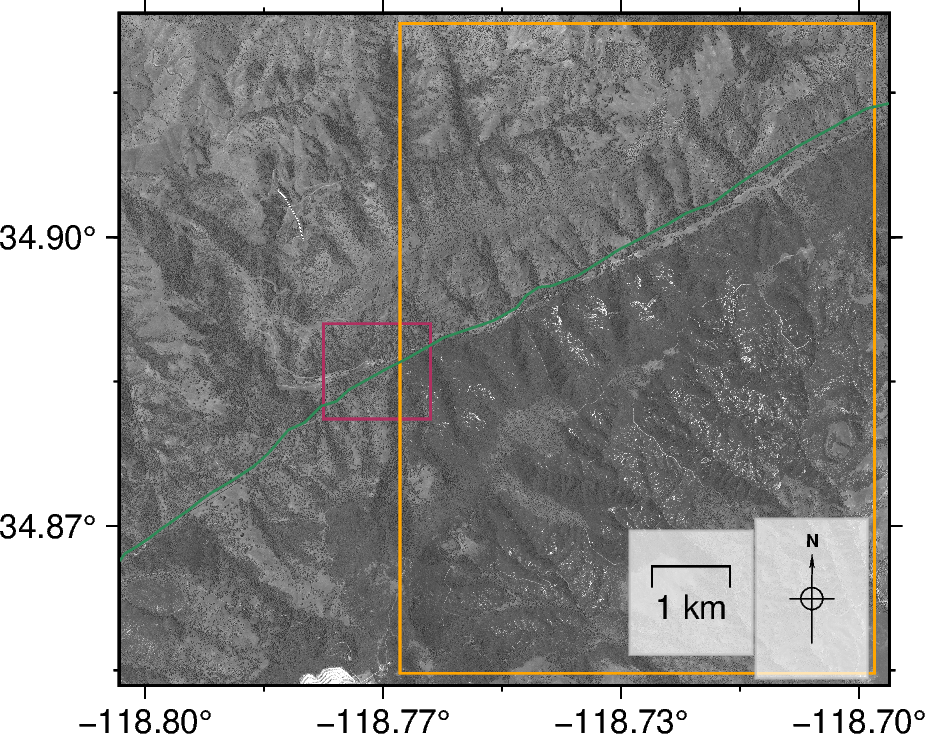

In [13]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=w_inset_region, projection="M6.5c", frame=["WSen", "af"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im2_lonlat,cmap=True)

# Inset of inset
rectangle = [[w_inset[0], w_inset[2], w_inset[1], w_inset[3]]]
fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")
# Inset of inset
rectangle = [[small_region[0], small_region[2], small_region[1], small_region[3]]]
fig.plot(data=rectangle, style="r+s", pen="0.55p,orange")

# Fault
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockWInset.pdf',dpi=300)

fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


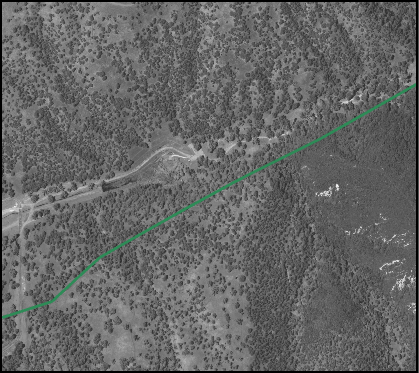

In [68]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=w_inset, projection="M3.5c", frame=["wsen"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im2_lonlat,cmap=True)

# Fault
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockWInsetZoom.pdf',dpi=300)

fig.show()

## DEMs and Land Cover Classification maps

In [3]:
# Load dems and landcover
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped.tif')
im1_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/2020GarlockEastDEM-cropped-f32.tif')
im2_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockWestAOI_10m.tif')
im3_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockEastAOI_10m.tif')
im4_lonlat = image.rio.reproject("EPSG:4326")

<>:21: SyntaxWarning: "is" with 'str' literal. Did you mean "=="?
<>:21: SyntaxWarning: "is" with 'str' literal. Did you mean "=="?
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_55820/1170631562.py:21: SyntaxWarning: "is" with 'str' literal. Did you mean "=="?
  if name is 'W':
/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


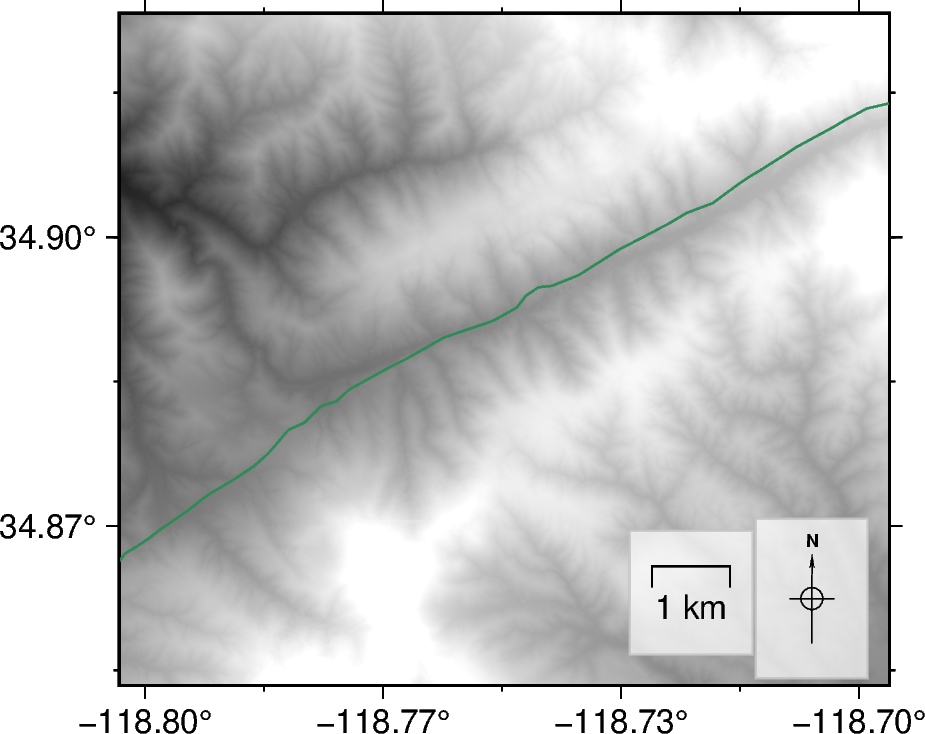

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


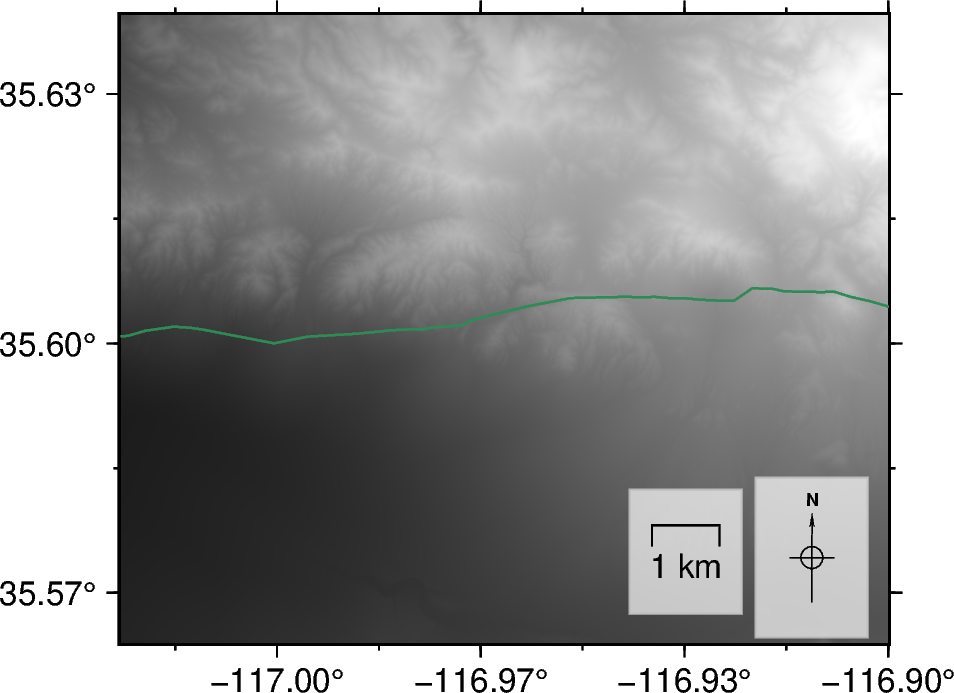

In [54]:
# Define the region and grid for each subplot
region = [w_inset_region,e_inset_region]  # Define your main region
images = [im1_lonlat,im2_lonlat]
name = ['W','E']

for reg, im, name in zip(region,images,name):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",
                 FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=reg, projection="M6.5c", frame=["WSen", "af"])

    # Orthophoto
    pygmt.makecpt(cmap="gray", series=[500, 1500])
    fig.grdimage(grid=im,cmap=True)

    # Faults
    if name is 'W':
        pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
        pts['id'] = pts.index
        # Project to UTM
        pts['x'], pts['y'] = pts.Lon, pts.Lat
        pts.dropna(inplace=True)
        pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
        pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
        pts.sort_values(by='Lon',ascending=True,inplace=True)
    else: 
        pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
        pts.sort_values(by='Lon',ascending=True,inplace=True)
        
    fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/Garlock{name}DEM.pdf',dpi=300)

    fig.show()


/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_55820/505960597.py:44: SyntaxWarning: Short-form parameter (E) is not recommended. Use long-form parameter 'nlevels' instead.
  pygmt.grd2cpt(im,E=6,cmap='categorical',color_model=f'+c{labels}',continuous=False)


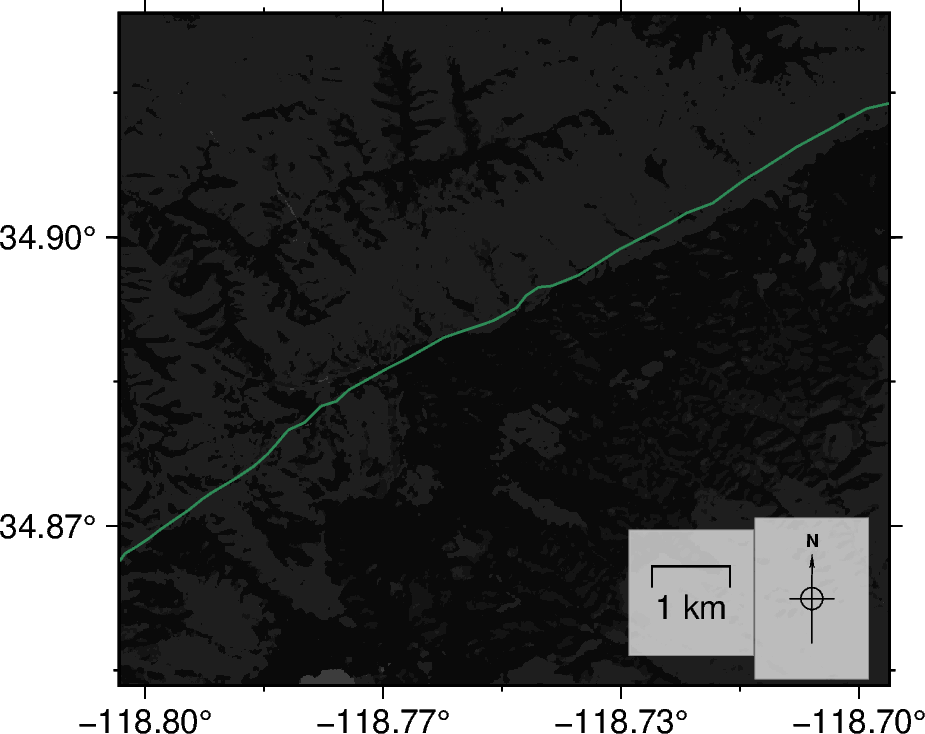

/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_55820/505960597.py:44: SyntaxWarning: Short-form parameter (E) is not recommended. Use long-form parameter 'nlevels' instead.
  pygmt.grd2cpt(im,E=6,cmap='categorical',color_model=f'+c{labels}',continuous=False)


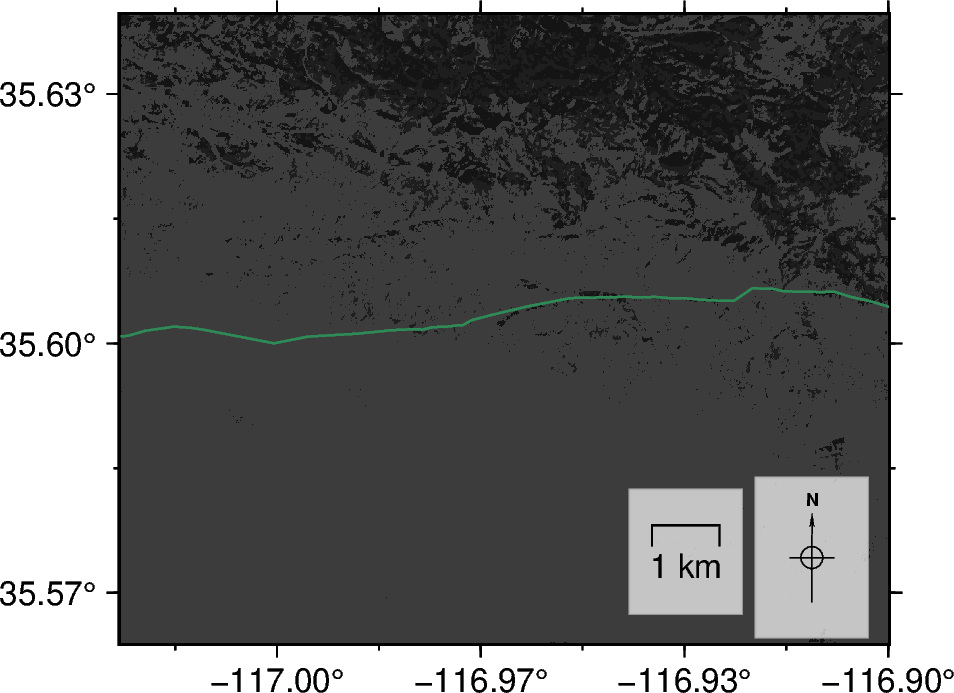

In [93]:
import pygmt
import pandas as pd

# Define the region and grid for each subplot
region = [w_inset_region,e_inset_region]  # Define your main region
images = [im3_lonlat,im4_lonlat]
name = ['W','E']

# World Cover Colors
# Define colorblind-friendly colors
colors = [
    '#377eb8',  # Blue
    '#e41a1c',  # Red
    '#4daf4a',  # Green
    '#ff7f00',  # Orange
    '#984ea3',  # Purple
    '#a65628',  # Brown
]

# Map of ESA WorldCover 2021 classes
landcover_names = {
    10: 'Trees',
    20: 'Shrubs',
    30: 'Grassland',
    50: 'Built-up',
    60: 'Barren', 
    80: 'Water'
}

for reg, im, name in zip(region,images,name):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",
                 FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=reg, projection="M6.5c", frame=["WSen", "af"])

    # Orthophoto
    C = colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]
    n = str(list(landcover_names.keys())).replace(', ','/').replace('[','').replace(']','')
    labels=str(list(landcover_names.values())).replace('\', \'',',').replace('[\'','').replace('\']','')
    pygmt.grd2cpt(im,E=6,cmap='categorical',color_model=f'+c{labels}',continuous=False)
    fig.grdimage(grid=im)

    # Faults
    if name == 'W':
        pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
        pts['id'] = pts.index
        # Project to UTM
        pts['x'], pts['y'] = pts.Lon, pts.Lat
        pts.dropna(inplace=True)
        pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
        pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
        pts.sort_values(by='Lon',ascending=True,inplace=True)
    else: 
        pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
        pts.sort_values(by='Lon',ascending=True,inplace=True)
        
    fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/Garlock{name}LandCover.pdf',dpi=300)

    fig.show()

In [94]:
im.data

array([[[20, 20, 20, ..., 60, 60, 60],
        [20, 20, 20, ..., 60, 60, 60],
        [20, 20, 20, ..., 60, 60, 60],
        ...,
        [60, 60, 60, ..., 60, 60, 60],
        [60, 60, 60, ..., 60, 60, 60],
        [60, 60, 60, ..., 60, 60, 60]]], dtype=uint8)

/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_55820/2211224348.py:7: SyntaxWarning: Short-form parameter (E) is not recommended. Use long-form parameter 'nlevels' instead.
  pygmt.grd2cpt(im,E=6,cmap='categorical',color_model=f'+c{labels}',continuous=False)


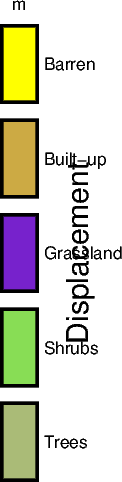

In [92]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="8p")
C = colors[0]+'/'+colors[1]+'/'+colors[2]+'/'+colors[3]+'/'+colors[4]+'/'+colors[5]
n = str(list(landcover_names.keys())).replace(', ','/').replace('[','').replace(']','')
labels=str(list(landcover_names.values())).replace('\', \'',',').replace('[\'','').replace('\']','')
pygmt.grd2cpt(im,E=6,cmap='categorical',color_model=f'+c{labels}',continuous=False)
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lDisplacement", "y+lm"])
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/Colorbar0.5.pdf',dpi=300)
fig.show()

# Deformation grids

In [ ]:
# Load deformation grids
im1_lonlat = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif')
im2_lonlat = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif')
im3_lonlat = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif')

im4_lonlat = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif')
im5_lonlat = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif')
im6_lonlat = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif')

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


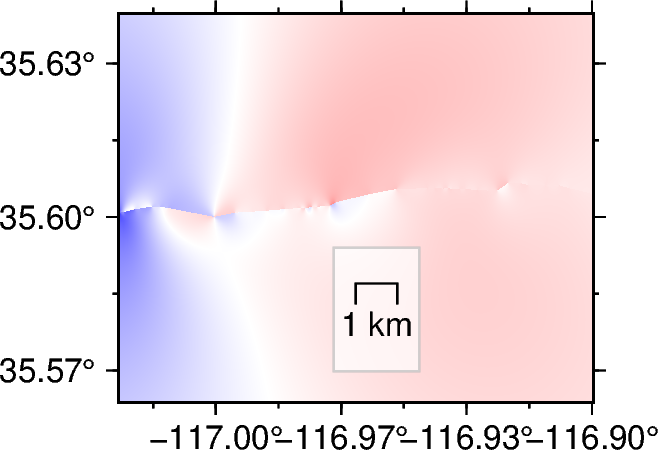

In [5]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['Edx','Edy','Edz','Wdx','Wdy','Wdz']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for im,n in zip([imlist[1]],[name[1]]):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

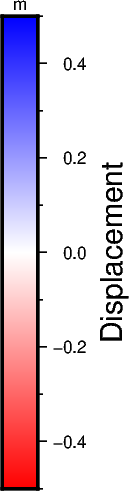

In [3]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lDisplacement", "y+lm"])
fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/Colorbar0.5.pdf',dpi=300)
fig.show()

## Filtered result maps and residual maps

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


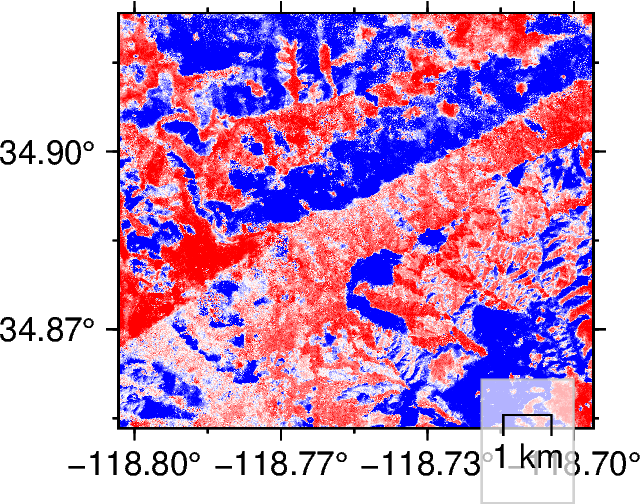

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


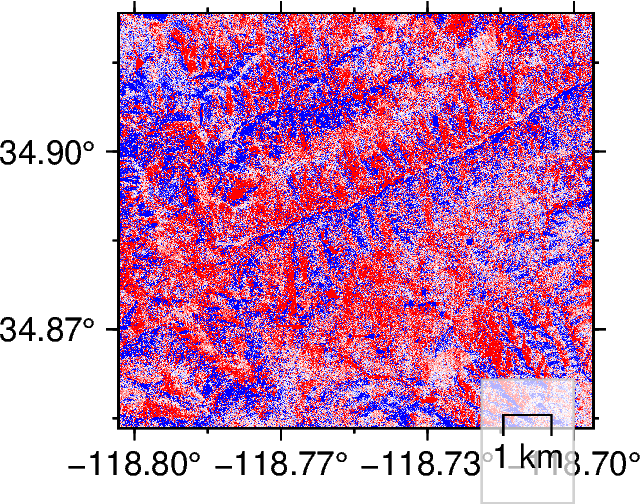

In [3]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDDispStackedEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDDispStackedEPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['ExNoFilt','EyNoFilt','EzNoFilt','WxNoFilt','WyNoFilt','WzNoFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[4:],name[4:]):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


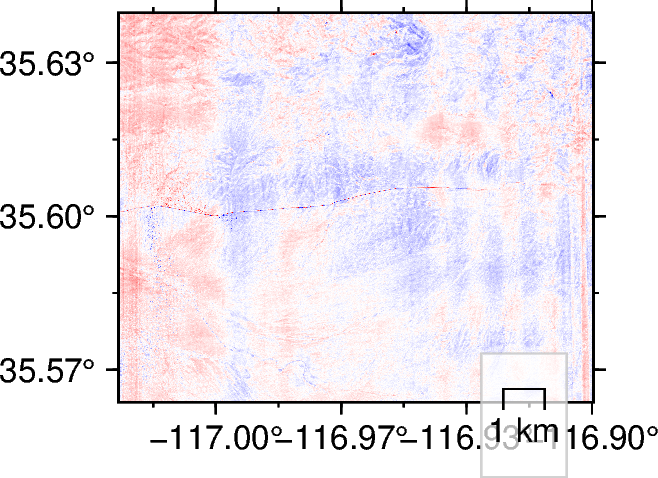

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


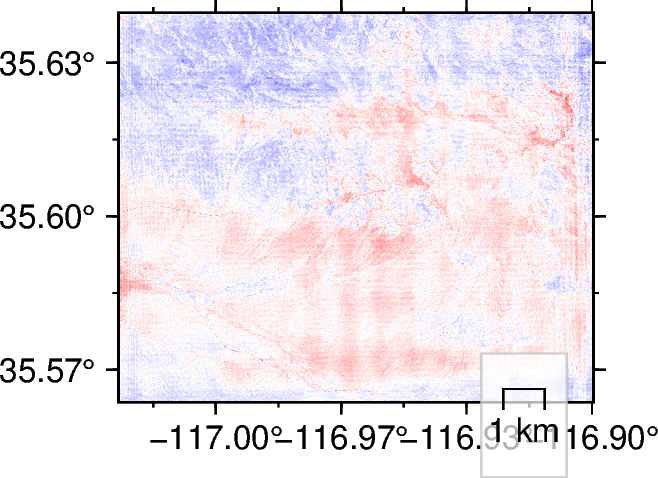

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


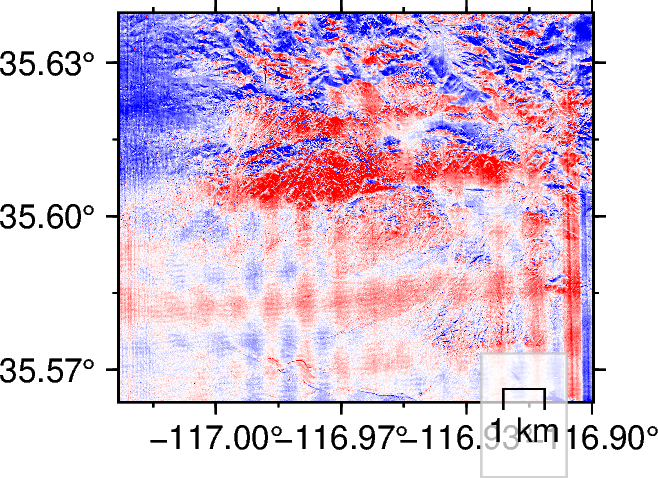

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


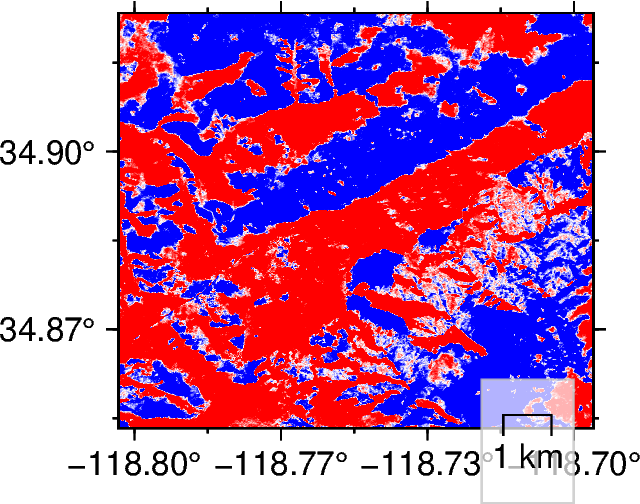

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


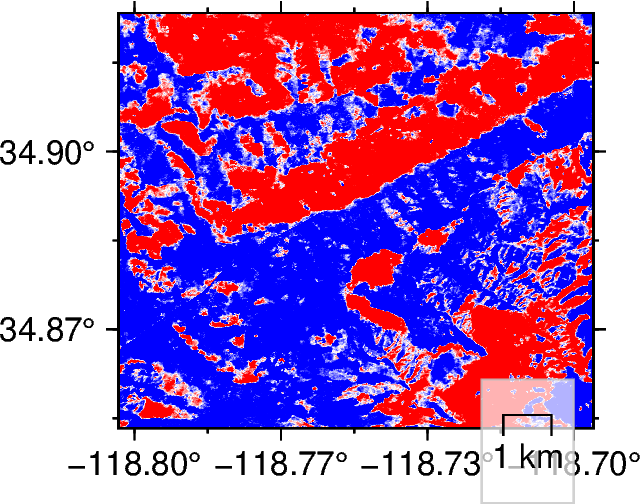

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


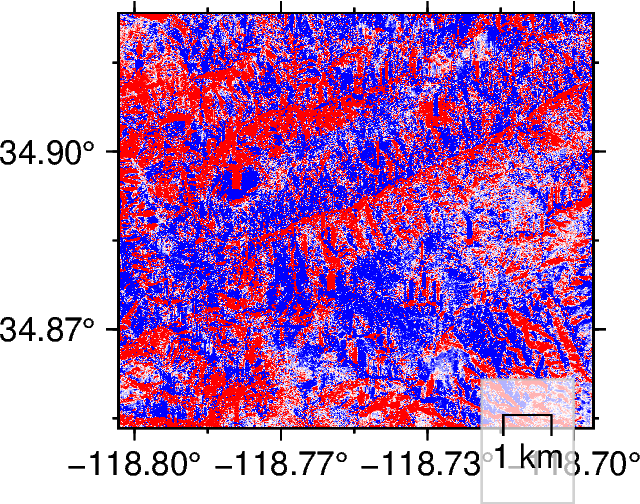

In [ ]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDDispStackedEPSG4326_bidenoise_filtered.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDDispStackedEPSG4326_bidenoise_filtered.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif'
im3m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif'

im4m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif'
im5m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif'
im6m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif'

# Introductory figure base
name = ['ExDenoiseFiltRes','EyDenoiseFiltRes','EzDenoiseFiltRes','WxDenoiseFiltRes','WyDenoiseFiltRes','WzDenoiseFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im3m_lonlat,im4m_lonlat,im5m_lonlat,im6m_lonlat]
for iml,imm,n in zip(imlist,immlist,name):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    im = immo - imob # model minus observed
    im -= im.mean()

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

# DEMs

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


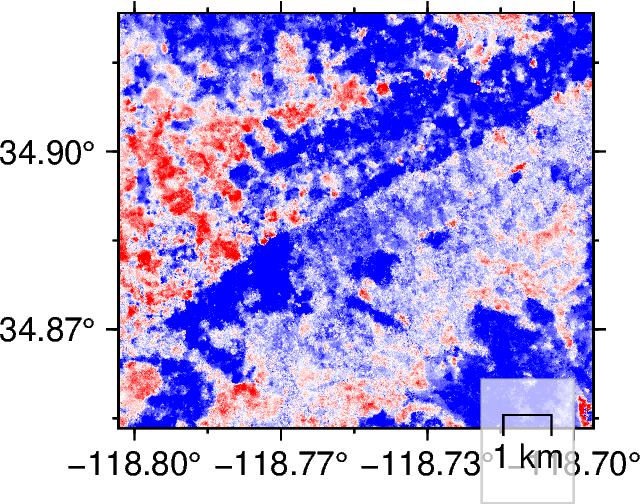

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


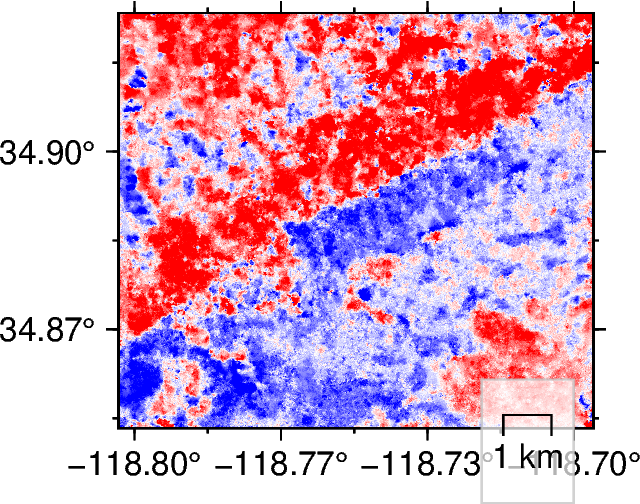

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


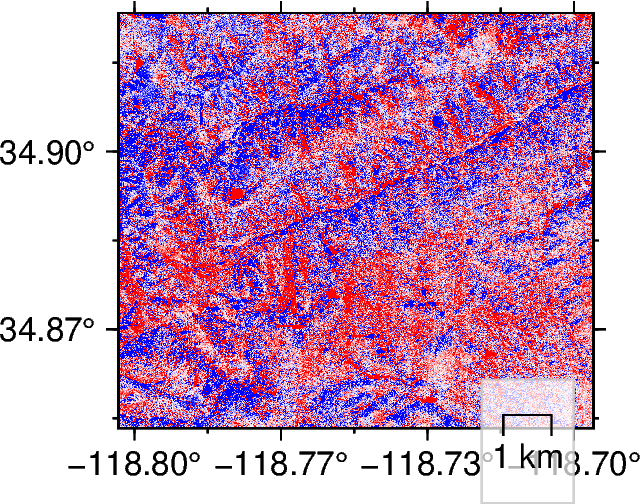

In [5]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['ExDEMNoFilt','EyNoDEMFilt','EzNoDEMFilt','WxNoDEMFilt','WyNoDEMFilt','WzNoDEMFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[3:],name[3:]):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


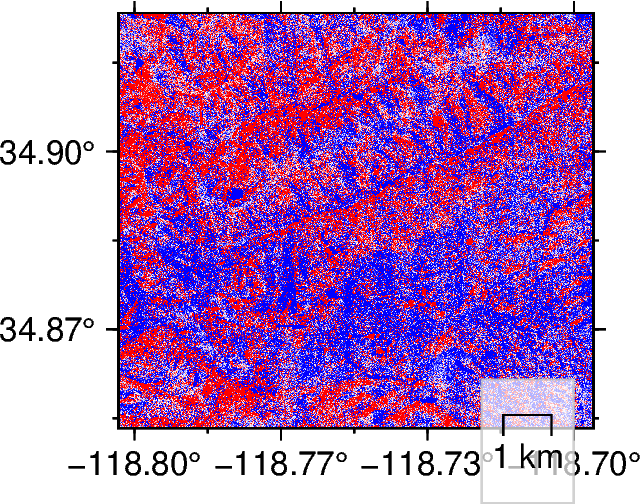

In [ ]:
# DEMs residuals
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif'
im3m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif'

im4m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif'
im5m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif'
im6m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif'

# Introductory figure base
name = ['ExDEMnoFiltRes','EyDEMnoFiltRes','EzDEMnoFiltRes','WxDEMnoFiltRes','WyDEMnoFiltRes','WzDEMnoFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im3m_lonlat,im4m_lonlat,im5m_lonlat,im6m_lonlat]
for iml,imm,n in zip(imlist[5:],immlist[5:],name[5:]):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    im = immo - imob # model minus observed
    im -= im.mean()

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    #fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

## Garlock West Clipped Region

In [8]:
# Maps of clip region - Correl files from ortho best pair and dem

# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/CorrelmicmacEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/CorrelmicmacEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/Correl-clipped-EPSG4326.tif'
im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/Correl-clipped-EPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['WcorrelOrthoOrg','WcorrelDEMOrg','WcorrelOrthoJanFeb','WcorrelDEMJanFeb']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat]
for iml,n in zip(imlist[3:],name[3:]):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='gray',series=[0.1,1],background='o')
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    #fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


KeyboardInterrupt: 

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


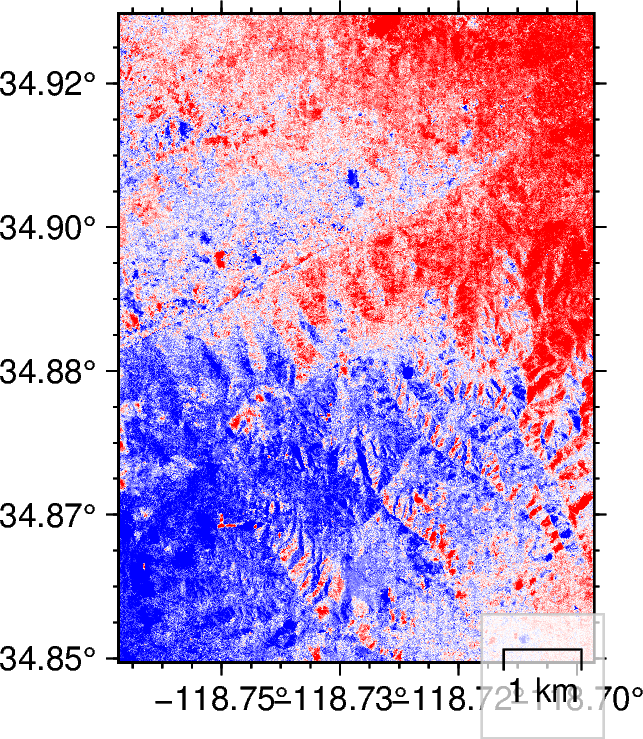

In [3]:
# DEMs residuals
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/EW-clipped-EPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/NS-clipped-EPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/EW-clipped-EPSG4326.tif'
im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/NS-clipped-EPSG4326.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326-clipped.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326-clipped.tif'

# Introductory figure base
name = ['WxDEMJanFebnoFiltRes','WyDEMJanFebnoFiltRes','WxOrthoJanFebnoFiltRes','WyOrthoJanFebnoFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im1m_lonlat,im2m_lonlat]
for iml,imm,n in zip(imlist[3:],immlist[3:],name[3:]):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    imob.data = (immo.data - imob.data) - np.mean(immo.data - imob.data) # model minus observed

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=imob,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


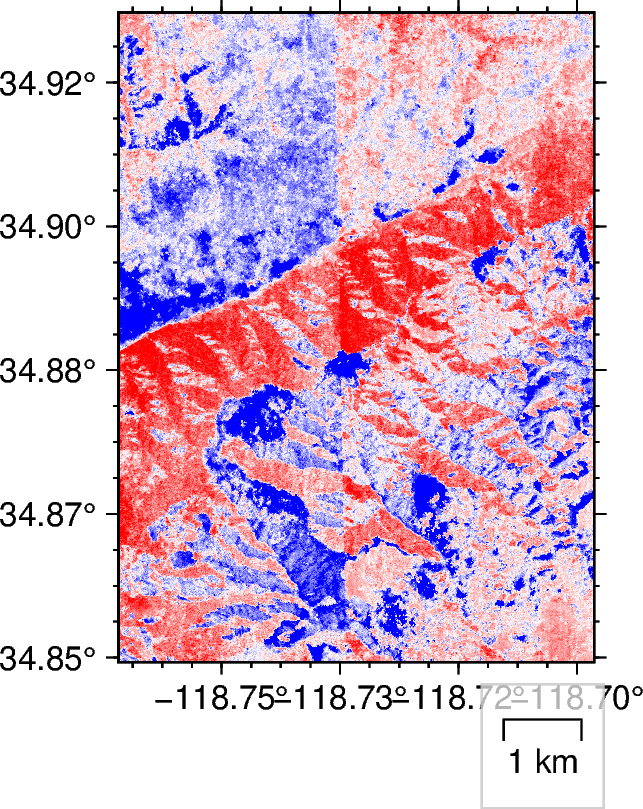

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


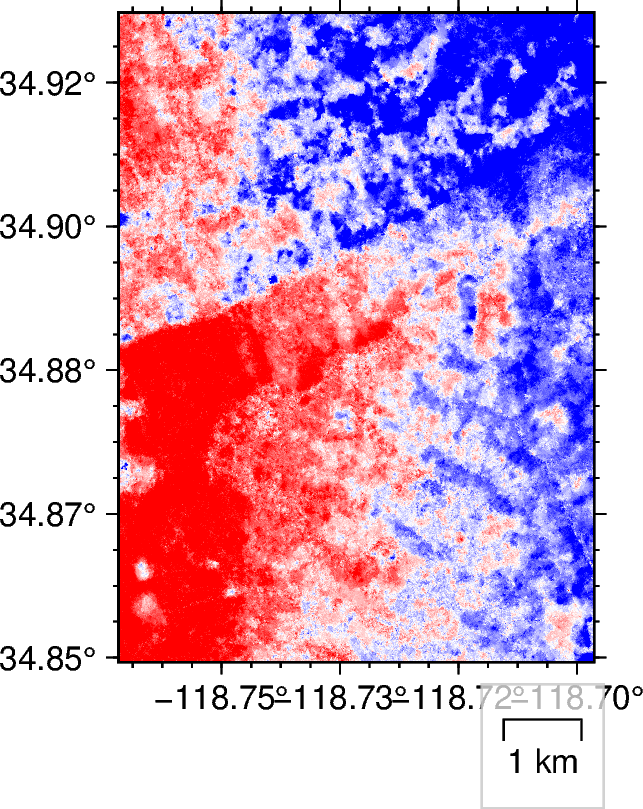

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


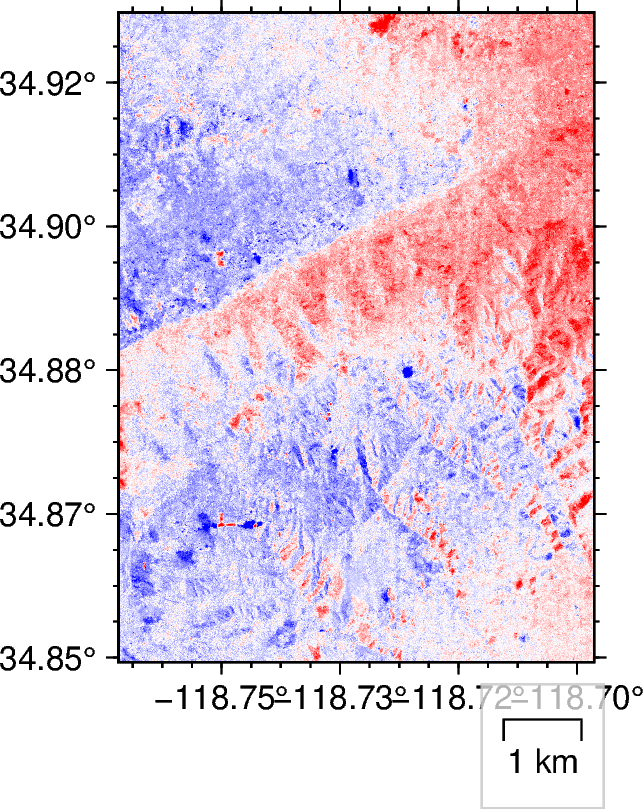

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


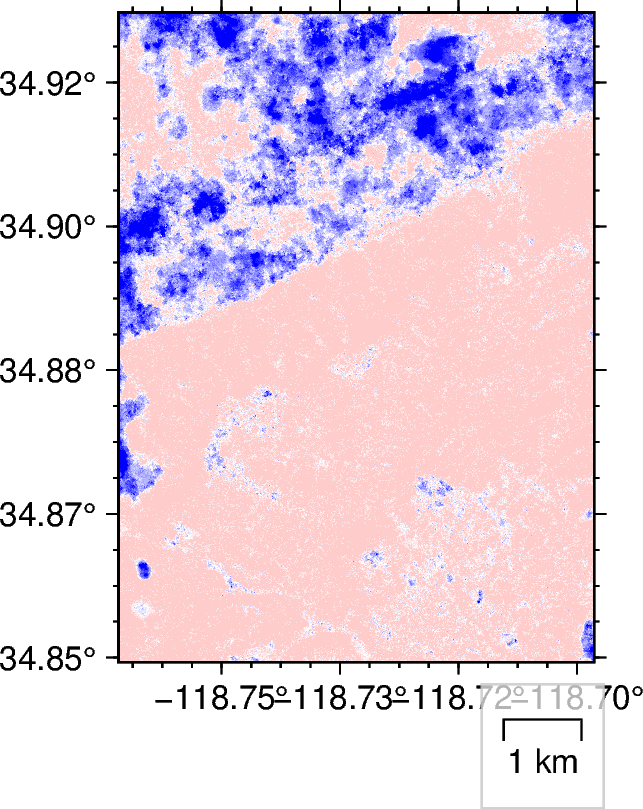

In [3]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/EW-clipped-EPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/EW-clipped-EPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/NS-clipped-EPSG4326.tif'
im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/NS-clipped-EPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['WdXOrthoJanFeb','WdXDEMJanFeb','WdYOrthoJanFeb','WdYDEMJanFeb']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat]
for iml,n in zip(imlist,name):
    im = rioxarray.open_rasterio(iml)
    im -= im.mean()
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

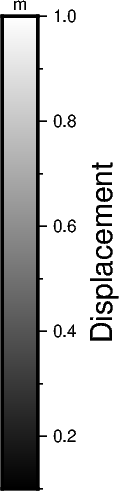

In [12]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap='gray',series=[0.1,1.0],background='o')
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lCorrelation", "y+lm"])
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/ColorbarGray.pdf',dpi=300)
fig.show()

## Stacked vs Single result 

In [20]:
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/CorrelmicmacEPSG4326.tif

Creating output file that is 21560P x 15499L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmacEPSG4326.tif.
Processing /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 21560P x 15499L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmacEPSG4326.tif

In [5]:
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/CorrelmicmacEPSG4326.tif

Creating output file that is 25061P x 16759L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmacEPSG4326.tif.
Processing /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 25061P x 16759L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmacEPSG4326.tif

In [23]:
foldlist = ['defaultsMEC1','defaultsMEC2','defaultsMEC3','defaultsMEC4','defaultsMECdem']
Region = 'West'
for fold in foldlist:
    for direction, cart in zip(['EW','NS','UD'],['X','Y','Z']):
        imun = rioxarray.open_rasterio(f'/Volumes/Extreme Pro/Projects/Garlock/Deformation/{Region}/micmac/{fold}/{direction}micmacEPSG4326.tif')
        imst = rioxarray.open_rasterio(f'/Volumes/Extreme Pro/Projects/Garlock/Deformation/{Region}/micmac/{direction}DispStackedEPSG4326.tif')
        #imco = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/CorrelmicmacEPSG4326.tif')

        immo = rioxarray.open_rasterio(f'/Volumes/Extreme Pro/Projects/Garlock/Deformation/{Region}/{Region}d{cart}-rioEPSG4326.tif')

        # Residual maps of model vs unstacked and stacked results
        im1 = immo - imun
        
        im1 -= im1.mean()
        im2 = immo - imst
        im2 -= im2.mean()

        print('Mean rmse, unstacked vs stacked',fold, direction)
        print(np.round(np.mean(np.abs(im1)).values*100,1),np.round(np.mean(np.abs(im2)).values*100,1))


Mean rmse, unstacked vs stacked defaultsMEC1 EW
121.9 102.5
Mean rmse, unstacked vs stacked defaultsMEC1 NS
90.1 82.3
Mean rmse, unstacked vs stacked defaultsMEC1 UD
161.1 155.3
Mean rmse, unstacked vs stacked defaultsMEC2 EW
79.4 102.5
Mean rmse, unstacked vs stacked defaultsMEC2 NS
59.1 82.3
Mean rmse, unstacked vs stacked defaultsMEC2 UD
155.0 155.3
Mean rmse, unstacked vs stacked defaultsMEC3 EW
133.0 102.5
Mean rmse, unstacked vs stacked defaultsMEC3 NS
119.3 82.3
Mean rmse, unstacked vs stacked defaultsMEC3 UD
160.1 155.3
Mean rmse, unstacked vs stacked defaultsMEC4 EW
109.5 102.5
Mean rmse, unstacked vs stacked defaultsMEC4 NS
100.2 82.3
Mean rmse, unstacked vs stacked defaultsMEC4 UD
157.9 155.3
Mean rmse, unstacked vs stacked defaultsMECdem EW
52.9 102.5
Mean rmse, unstacked vs stacked defaultsMECdem NS
44.4 82.3
Mean rmse, unstacked vs stacked defaultsMECdem UD
149.8 155.3


Mean rmse, unstacked vs stacked
8.5 7.3


In [86]:
print('Stdev of rmse, unstacked vs stacked')
print(np.round(np.std(np.abs(im1)).values*100,1),np.round(np.std(np.abs(im2)).values*100,1))


Stdev of rmse, unstacked vs stacked
6.6 6.8


In [98]:
(27.1+30.7)/2

28.9

In [8]:
im = im1

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


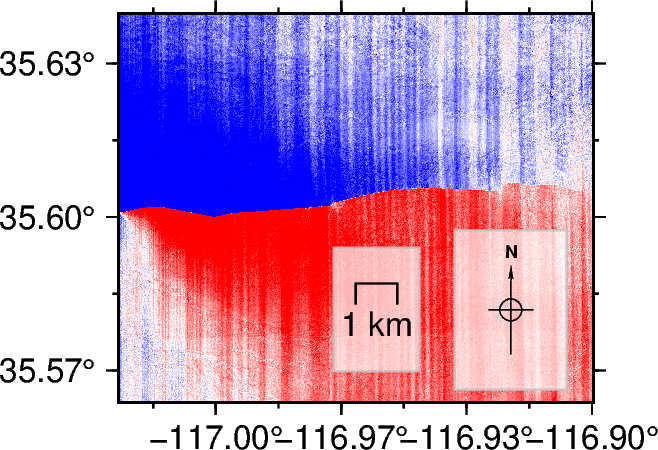

In [11]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
plt.close()
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=e_inset_region, projection="M4c", frame=["WSne", "af"])

# photo
if im is im1 or im is im2:
    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
else:
    pygmt.makecpt(cmap='gray',series=[0,1],background='o')
fig.grdimage(grid=im,cmap=True)



fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
if im is im1:
    fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/StackedVUnstacked-Unstacked.pdf',dpi=300)
if im is im2:
    fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/StackedVUnstacked-Stacked.pdf',dpi=300)
if im is imco:
    fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/StackedVUnstacked-Correl.pdf',dpi=300)

fig.show()

In [20]:
imco.

<xarray.DataArray (band: 1, y: 16759, x: 25061)> Size: 3GB
[419997299 values with dtype=float64]
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 200kB -117.0 -117.0 -117.0 ... -116.9 -116.9 -116.9
  * y            (y) float64 134kB 35.64 35.64 35.64 35.64 ... 35.56 35.56 35.56
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    _FillValue:     0.0
    scale_factor:   1.0
    add_offset:     0.0

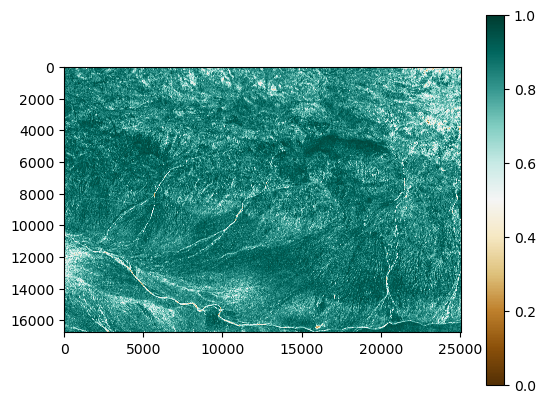

In [37]:
plt.imshow(im.data[0],vmin=0,vmax=1,cmap='BrBG')
plt.colorbar()